In [1]:
#real experiment: use data from big board

%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
from scipy import signal
import math
from keras.utils import np_utils

from __future__ import print_function

import keras
import keras.callbacks as cb
from keras.datasets import mnist
from keras.layers.core import Activation, Dense, Dropout
from keras.models import Sequential
from keras.optimizers import SGD
from keras.regularizers import l1, l2

import time

from sklearn import preprocessing
import pickle

Using TensorFlow backend.


In [2]:
def dataProcess(file,startCutThreshold,rangeThreshold,offsetNoise):
    '''startCutThreshold: cut noise in the begining (500)
       rangeThreshold:find maximum peak value in this range (80)
       offsetNoise:noise level above average (20)
    '''
    list_of_lists = []
    with open(file, "r") as f:
        for line in f:
            inner_list = [elt.strip() for elt in line.split('\t')]
            # in alternative, if you need to use the file content as numbers
            # inner_list = [int(elt.strip()) for elt in line.split(',')]
            list_of_lists.append(inner_list)
    print(np.shape(list_of_lists))   
    (a,b) = np.shape(list_of_lists)
    data = np.zeros((a,b))

    for x in range(0,a):
        data[x] = list(map(int,list_of_lists[x]))
    
    '''cut noise in the begining: 500'''
    data = data[startCutThreshold:,:]
    
    '''find channel dominate'''
    index_max = np.argmax(data[:,1:])
    channelDominate = index_max%9+1
    print(channelDominate)
        
    plt.plot(data[:,0],data[:,channelDominate],linewidth=0.5)
    plt.suptitle('Channel Dominate')
    plt.show()
    
    '''find peaks'''
    plt.plot(data[:,0],data[:,channelDominate],linewidth=0.5)
    peakind = signal.find_peaks_cwt(data[:,channelDominate],np.arange(1,300))
    plt.plot(data[peakind,0], data[peakind,channelDominate], 'rx')
    plt.suptitle('Raw Peaks')
    plt.show()
    
    '''find accurate peaks'''
    peakind0 = accPeak(peakind,data,channelDominate,rangeThreshold)
    plt.plot(data[:,0],data[:,channelDominate],linewidth=0.5)
    plt.plot(data[peakind0,0], data[peakind0,channelDominate], 'rx') 
    plt.suptitle('Accurate Peaks')
    plt.show()
        
    '''filter noise'''
    ind = filterNoise(peakind0,data,channelDominate,offsetNoise)
    peakind0 = np.delete(peakind0,ind,None)
    plt.plot(data[:,0],data[:,channelDominate],linewidth=0.5)
    plt.plot(data[peakind0,0], data[peakind0,channelDominate], 'rx') 
    plt.suptitle('Filter Noise')
    plt.show()
    
    '''filter 10% highest and 10% lowest peaks'''
    ind = filterPeck(peakind0,data,channelDominate)
    peakind0 = np.delete(peakind0,ind,None)
    plt.plot(data[:,0],data[:,channelDominate],linewidth=0.5)
    plt.plot(data[peakind0,0], data[peakind0,channelDominate], 'rx')
    plt.suptitle('Filter High & Low')
    plt.show()
    
    peakindTrue = []
    for channel in range(1, 10):
        peakindTrue[channel-1] = accPeak(peakind0,data,channel,rangeThreshold)
        plt.plot(data[:,0],data[:,channel],linewidth=0.5)
        plt.plot(data[peakindTrue[channel-1],0], data[peakindTrue[channel-1],channel], 'rx') 
        plt.suptitle('sensor'+str(channel))
        plt.show()
  
    dataProcessed = []
    for i in range(1, 10):
        dataProcessed.append(data[peakindTrue[i-1], i])

    dataProcessed = list(map(list,zip(*dataProcessed)))
    return dataProcessed

def filterNoise(peakind,data,channel,offsetNoise):
    ind = []
    noise = np.mean(data[:,channel])
    for i in range(len(peakind)):
        if data[peakind,channel][i] < noise +offsetNoise:
            ind.append(i)
    return ind

def filterPeck(peakind,data,channel):
    ind = []
    dataPeak = []
    cutNumber = math.ceil(0.1*len(peakind))
    for i in range(len(peakind)):
        dataPeak.append(data[peakind,channel][i])
        
    indexSorted = sorted(enumerate(dataPeak), key=lambda x:x[1])
    for i in range(cutNumber):
        ind.append(indexSorted[i][0])
        ind.append(indexSorted[len(peakind)-1-i][0])
   
    return ind

def accPeak(peakind,data,channel,rangeThreshold):
    peakindTrue = []
    for j in range(peakind.shape[0]):
        maxvalue = data[peakind[j],channel]
        maxind = peakind[j]
        for k in range(max(-rangeThreshold,-peakind[j]),min(rangeThreshold+1,data.shape[0]-1-peakind[j])):
            if data[peakind[j]+k,channel]>maxvalue:
                maxvalue = data[peakind[j]+k,channel]
                maxind = peakind[j]+k
        peakindTrue.append(maxind)
        
    return peakindTrue

(9612, 10)
1


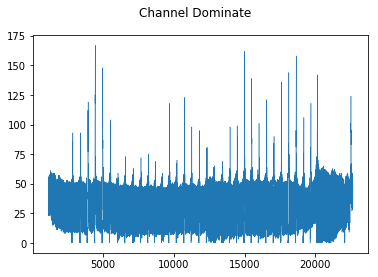

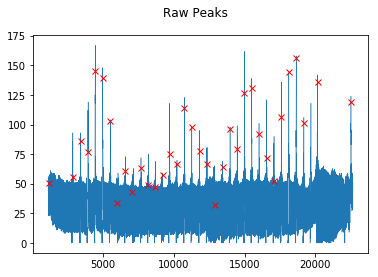

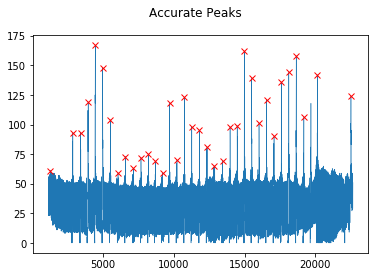

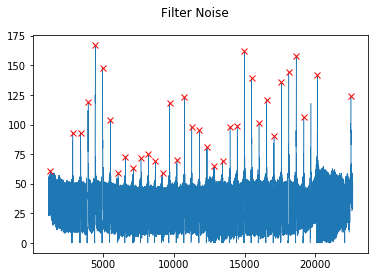

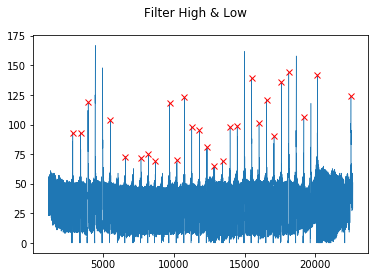

...

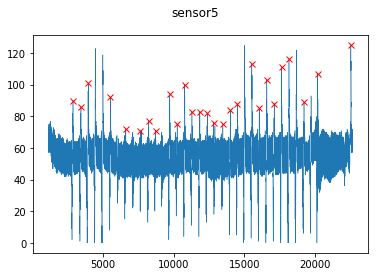

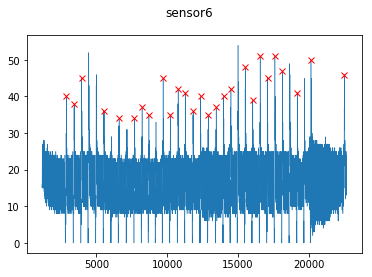

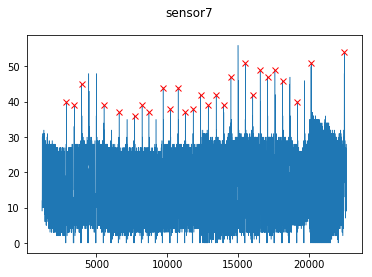

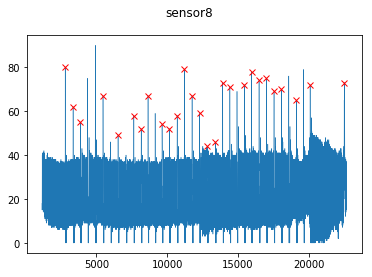

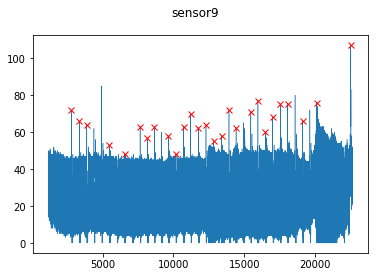

[[93.0, 94.0, 101.0, 154.0, 90.0, 40.0, 40.0, 80.0, 72.0], [93.0, 87.0, 94.0, 120.0, 86.0, 38.0, 39.0, 62.0, 66.0], [119.0, 117.0, 119.0, 113.0, 101.0, 45.0, 45.0, 55.0, 64.0], [104.0, 96.0, 96.0, 143.0, 92.0, 36.0, 39.0, 67.0, 53.0], [73.0, 66.0, 79.0, 110.0, 72.0, 34.0, 37.0, 49.0, 48.0], [72.0, 69.0, 77.0, 116.0, 71.0, 34.0, 36.0, 58.0, 63.0], [75.0, 77.0, 91.0, 117.0, 77.0, 37.0, 39.0, 52.0, 57.0], [69.0, 69.0, 81.0, 119.0, 71.0, 35.0, 37.0, 67.0, 63.0], [118.0, 113.0, 115.0, 126.0, 94.0, 45.0, 44.0, 54.0, 58.0], [70.0, 71.0, 84.0, 102.0, 75.0, 35.0, 38.0, 52.0, 48.0], [123.0, 113.0, 109.0, 133.0, 100.0, 42.0, 44.0, 58.0, 63.0], [98.0, 91.0, 93.0, 143.0, 83.0, 41.0, 37.0, 79.0, 70.0], [95.0, 88.0, 93.0, 126.0, 83.0, 36.0, 38.0, 67.0, 62.0], [81.0, 84.0, 97.0, 107.0, 82.0, 40.0, 42.0, 59.0, 64.0], [65.0, 67.0, 81.0, 100.0, 76.0, 35.0, 39.0, 44.0, 55.0], [69.0, 70.0, 83.0, 97.0, 75.0, 37.0, 42.0, 46.0, 58.0], [98.0, 91.0, 95.0, 123.0, 84.0, 40.0, 39.0, 73.0, 72.0], [99.0, 93.0, 104.0

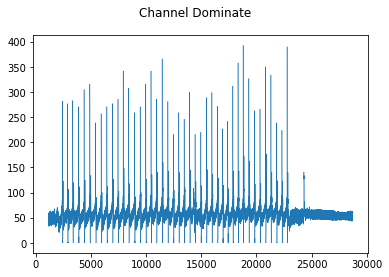

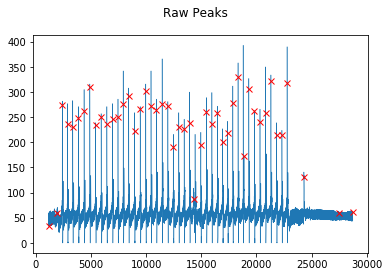

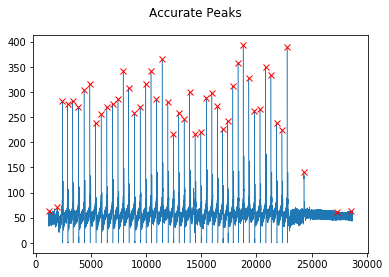

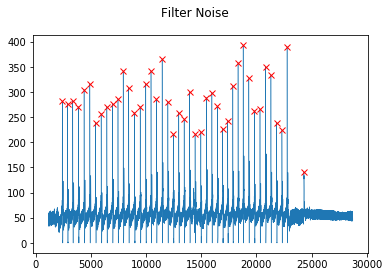

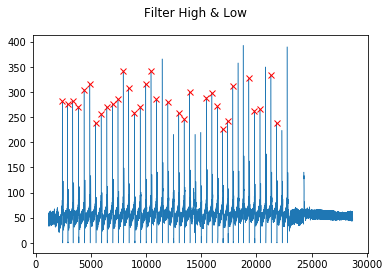

...

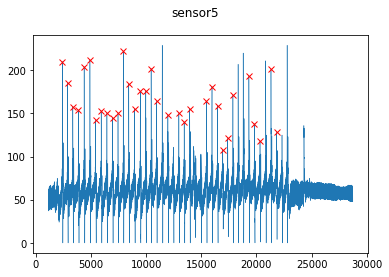

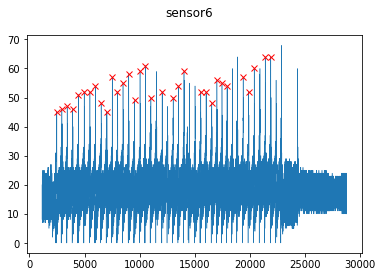

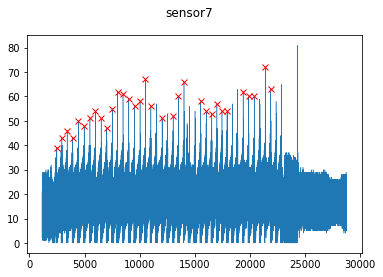

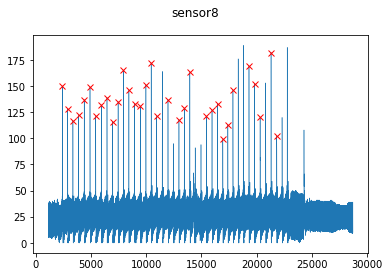

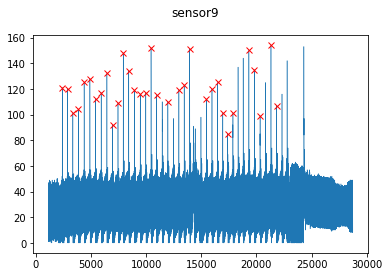

[[150.0, 155.0, 146.0, 282.0, 210.0, 45.0, 39.0, 150.0, 121.0], [122.0, 128.0, 129.0, 277.0, 185.0, 46.0, 43.0, 128.0, 120.0], [147.0, 153.0, 149.0, 283.0, 158.0, 47.0, 46.0, 117.0, 101.0], [127.0, 120.0, 108.0, 271.0, 154.0, 46.0, 43.0, 122.0, 104.0], [157.0, 159.0, 141.0, 305.0, 204.0, 51.0, 50.0, 137.0, 125.0], [167.0, 166.0, 147.0, 316.0, 212.0, 52.0, 48.0, 149.0, 128.0], [104.0, 100.0, 102.0, 239.0, 142.0, 52.0, 51.0, 121.0, 112.0], [107.0, 99.0, 94.0, 257.0, 153.0, 54.0, 54.0, 132.0, 117.0], [108.0, 119.0, 124.0, 271.0, 150.0, 48.0, 51.0, 139.0, 132.0], [139.0, 129.0, 112.0, 277.0, 145.0, 45.0, 47.0, 116.0, 92.0], [133.0, 126.0, 115.0, 286.0, 150.0, 57.0, 55.0, 135.0, 109.0], [177.0, 175.0, 170.0, 342.0, 222.0, 52.0, 62.0, 165.0, 148.0], [147.0, 155.0, 150.0, 308.0, 184.0, 55.0, 61.0, 146.0, 134.0], [98.0, 99.0, 101.0, 259.0, 155.0, 58.0, 59.0, 133.0, 119.0], [96.0, 108.0, 115.0, 271.0, 176.0, 49.0, 56.0, 131.0, 116.0], [164.0, 164.0, 145.0, 316.0, 176.0, 59.0, 58.0, 151.0, 117.0

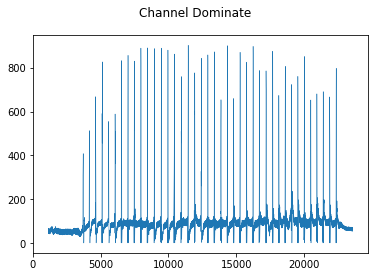

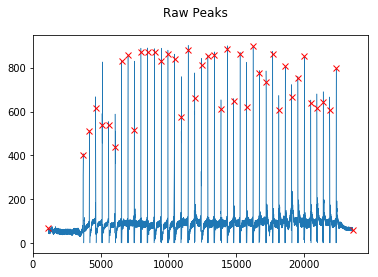

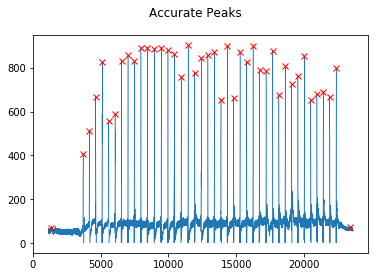

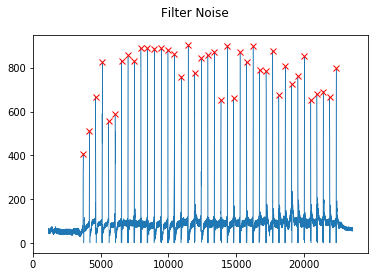

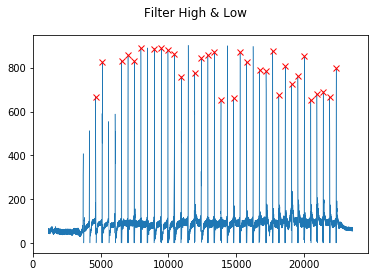

...

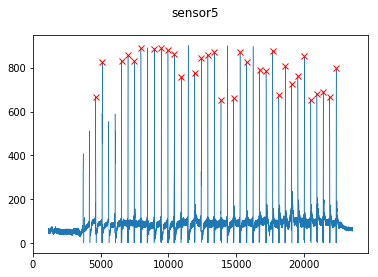

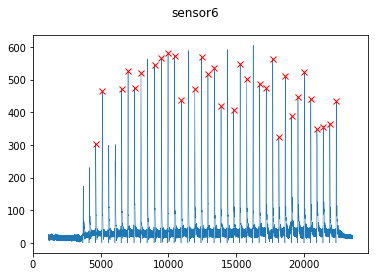

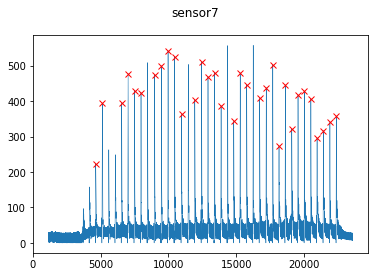

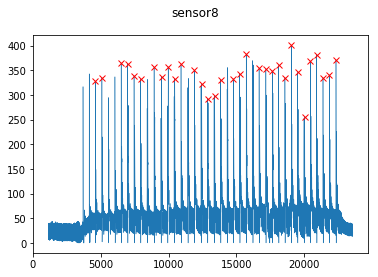

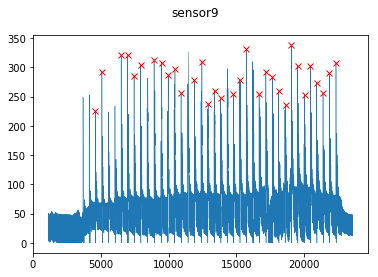

[[527.0, 404.0, 352.0, 624.0, 668.0, 304.0, 223.0, 328.0, 226.0], [455.0, 376.0, 362.0, 322.0, 827.0, 464.0, 394.0, 335.0, 293.0], [428.0, 337.0, 345.0, 426.0, 833.0, 471.0, 394.0, 364.0, 321.0], [380.0, 291.0, 299.0, 339.0, 857.0, 527.0, 478.0, 363.0, 321.0], [623.0, 436.0, 395.0, 382.0, 831.0, 475.0, 430.0, 339.0, 286.0], [250.0, 270.0, 297.0, 297.0, 890.0, 519.0, 424.0, 332.0, 304.0], [402.0, 338.0, 348.0, 307.0, 888.0, 546.0, 474.0, 356.0, 312.0], [266.0, 353.0, 235.0, 337.0, 890.0, 565.0, 500.0, 337.0, 308.0], [279.0, 397.0, 248.0, 284.0, 881.0, 582.0, 542.0, 357.0, 287.0], [303.0, 327.0, 258.0, 340.0, 863.0, 571.0, 526.0, 333.0, 297.0], [688.0, 470.0, 441.0, 446.0, 760.0, 436.0, 363.0, 362.0, 257.0], [663.0, 455.0, 445.0, 399.0, 777.0, 470.0, 403.0, 350.0, 278.0], [302.0, 377.0, 242.0, 432.0, 844.0, 568.0, 511.0, 322.0, 309.0], [417.0, 317.0, 298.0, 316.0, 859.0, 516.0, 469.0, 292.0, 238.0], [344.0, 276.0, 257.0, 304.0, 873.0, 536.0, 481.0, 298.0, 260.0], [633.0, 415.0, 342.0, 47

In [3]:
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l1f1.txt"
l1f1 = dataProcess(file,500,80,20)
print(l1f1)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l1f2.txt"
l1f2 = dataProcess(file,500,80,20)
print(l1f2)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l1f3.txt"
l1f3 = dataProcess(file,500,80,20)
print(l1f3)

(8858, 10)
2


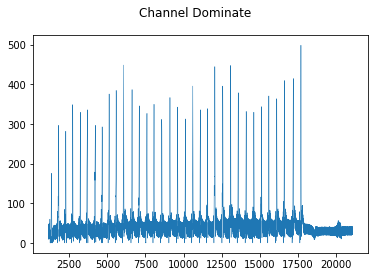

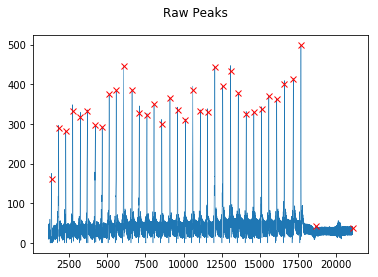

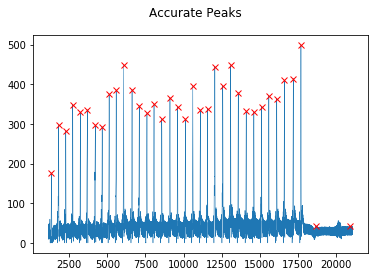

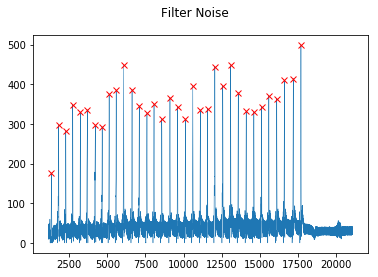

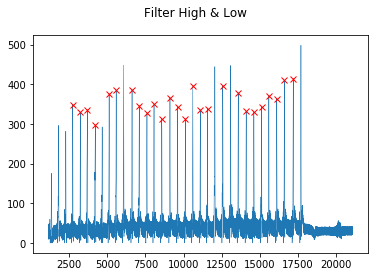

...

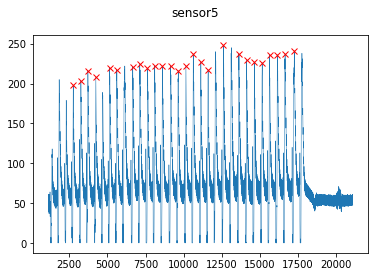

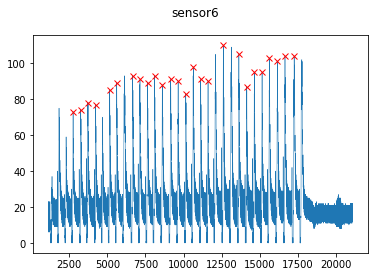

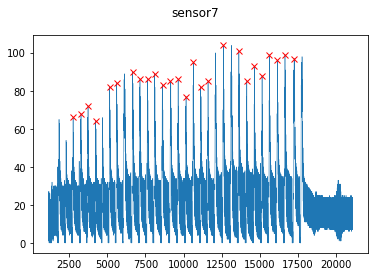

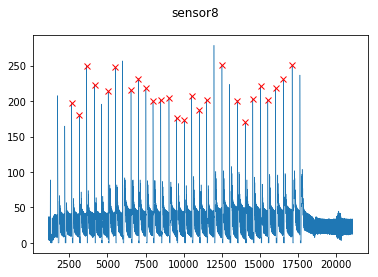

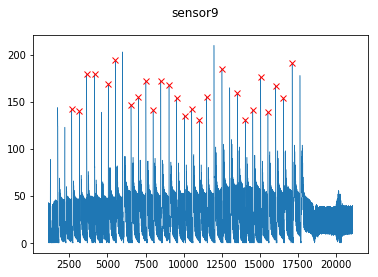

[[104.0, 349.0, 331.0, 376.0, 198.0, 73.0, 66.0, 197.0, 142.0], [105.0, 330.0, 340.0, 367.0, 203.0, 74.0, 68.0, 181.0, 140.0], [125.0, 336.0, 352.0, 400.0, 216.0, 78.0, 72.0, 250.0, 179.0], [117.0, 297.0, 320.0, 385.0, 208.0, 77.0, 64.0, 223.0, 179.0], [147.0, 376.0, 373.0, 380.0, 220.0, 85.0, 82.0, 214.0, 169.0], [137.0, 385.0, 378.0, 374.0, 217.0, 89.0, 84.0, 248.0, 194.0], [134.0, 387.0, 374.0, 383.0, 221.0, 93.0, 90.0, 216.0, 147.0], [146.0, 346.0, 366.0, 411.0, 224.0, 91.0, 86.0, 232.0, 155.0], [121.0, 327.0, 341.0, 375.0, 219.0, 89.0, 86.0, 218.0, 172.0], [139.0, 350.0, 353.0, 353.0, 222.0, 93.0, 89.0, 200.0, 141.0], [144.0, 312.0, 314.0, 354.0, 222.0, 88.0, 83.0, 202.0, 172.0], [144.0, 367.0, 357.0, 364.0, 222.0, 91.0, 85.0, 205.0, 168.0], [135.0, 343.0, 328.0, 318.0, 216.0, 90.0, 86.0, 177.0, 154.0], [132.0, 313.0, 321.0, 338.0, 222.0, 83.0, 77.0, 173.0, 135.0], [127.0, 396.0, 394.0, 345.0, 237.0, 98.0, 95.0, 207.0, 142.0], [132.0, 336.0, 341.0, 372.0, 227.0, 91.0, 82.0, 188.0,

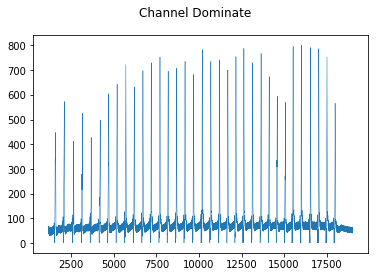

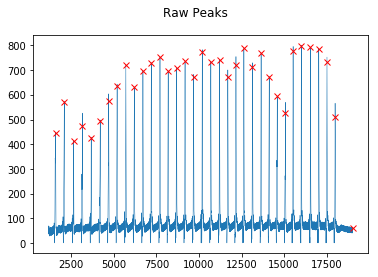

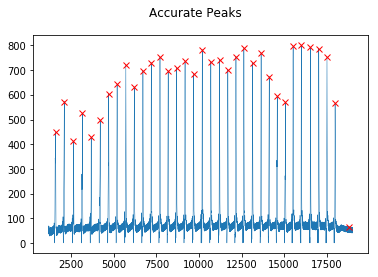

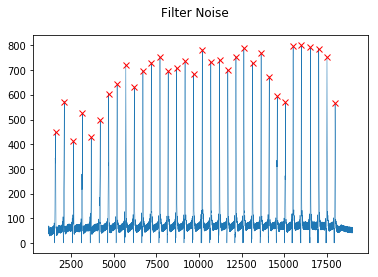

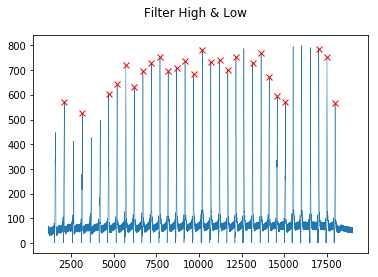

...

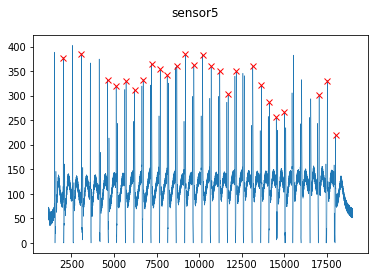

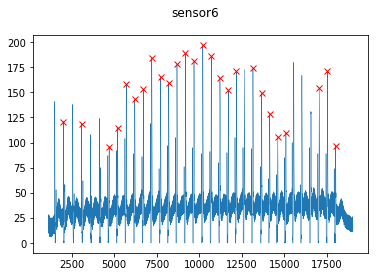

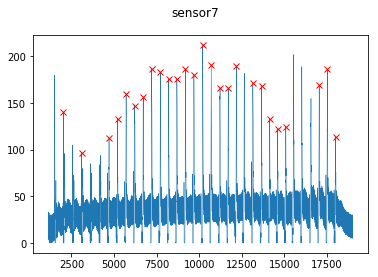

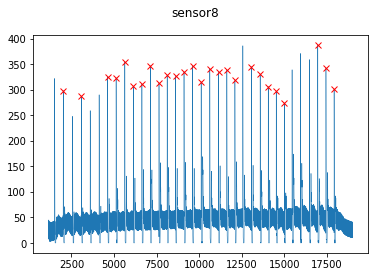

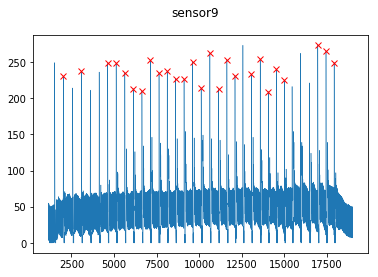

[[211.0, 564.0, 573.0, 727.0, 378.0, 121.0, 140.0, 298.0, 230.0], [199.0, 565.0, 526.0, 728.0, 386.0, 119.0, 96.0, 287.0, 237.0], [193.0, 660.0, 604.0, 728.0, 332.0, 96.0, 112.0, 325.0, 248.0], [220.0, 689.0, 643.0, 722.0, 320.0, 115.0, 133.0, 323.0, 248.0], [198.0, 741.0, 722.0, 708.0, 330.0, 158.0, 160.0, 354.0, 235.0], [175.0, 661.0, 632.0, 731.0, 311.0, 143.0, 147.0, 307.0, 213.0], [221.0, 728.0, 698.0, 756.0, 333.0, 153.0, 156.0, 311.0, 210.0], [185.0, 752.0, 730.0, 766.0, 365.0, 184.0, 187.0, 347.0, 252.0], [221.0, 749.0, 753.0, 746.0, 354.0, 165.0, 183.0, 313.0, 235.0], [240.0, 754.0, 696.0, 722.0, 342.0, 159.0, 176.0, 328.0, 237.0], [179.0, 722.0, 708.0, 766.0, 361.0, 178.0, 176.0, 326.0, 227.0], [184.0, 742.0, 736.0, 725.0, 385.0, 189.0, 186.0, 335.0, 226.0], [186.0, 713.0, 683.0, 638.0, 362.0, 181.0, 180.0, 346.0, 250.0], [215.0, 768.0, 783.0, 743.0, 384.0, 197.0, 212.0, 315.0, 214.0], [201.0, 741.0, 735.0, 719.0, 360.0, 186.0, 191.0, 341.0, 262.0], [210.0, 743.0, 742.0, 587.

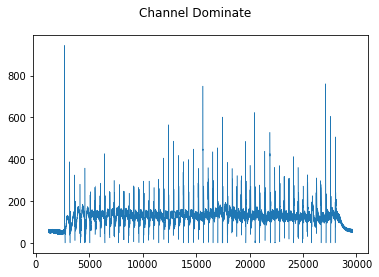

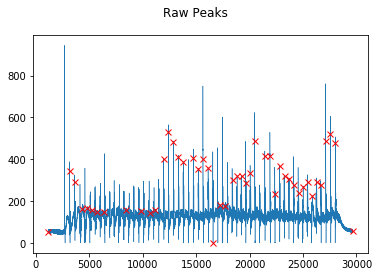

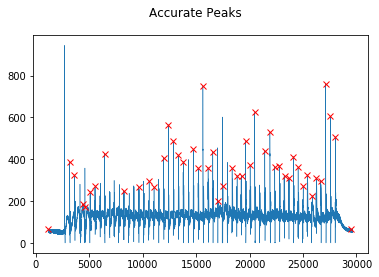

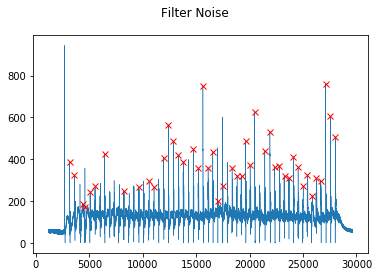

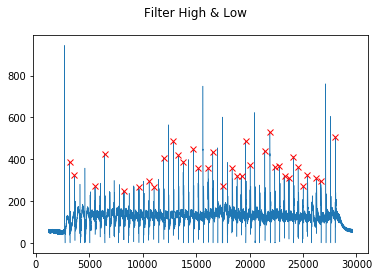

...

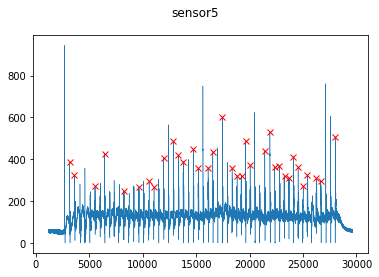

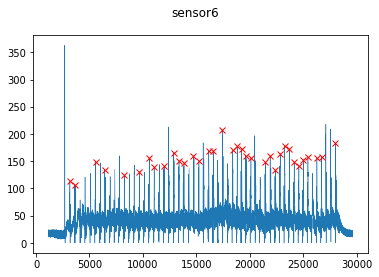

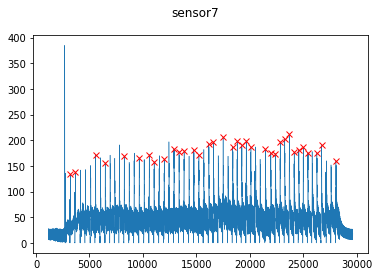

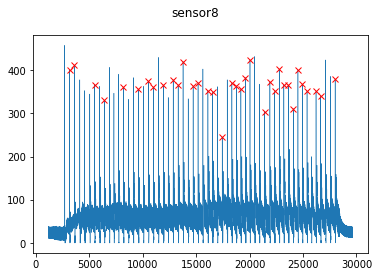

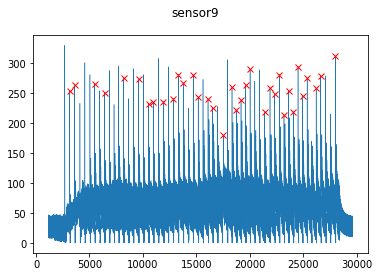

[[285.0, 779.0, 759.0, 723.0, 388.0, 113.0, 134.0, 401.0, 254.0], [304.0, 802.0, 735.0, 733.0, 325.0, 106.0, 138.0, 412.0, 263.0], [273.0, 769.0, 661.0, 363.0, 272.0, 149.0, 171.0, 367.0, 266.0], [287.0, 897.0, 671.0, 570.0, 427.0, 134.0, 156.0, 330.0, 251.0], [297.0, 772.0, 716.0, 401.0, 248.0, 124.0, 169.0, 361.0, 275.0], [306.0, 763.0, 711.0, 361.0, 266.0, 131.0, 166.0, 356.0, 273.0], [279.0, 762.0, 667.0, 336.0, 296.0, 156.0, 172.0, 374.0, 232.0], [281.0, 783.0, 708.0, 302.0, 265.0, 139.0, 158.0, 361.0, 235.0], [318.0, 926.0, 647.0, 589.0, 406.0, 141.0, 163.0, 366.0, 236.0], [317.0, 926.0, 650.0, 639.0, 487.0, 166.0, 183.0, 378.0, 241.0], [387.0, 940.0, 617.0, 600.0, 419.0, 151.0, 178.0, 366.0, 281.0], [381.0, 914.0, 610.0, 543.0, 389.0, 146.0, 179.0, 420.0, 267.0], [368.0, 925.0, 609.0, 546.0, 449.0, 160.0, 181.0, 363.0, 280.0], [346.0, 917.0, 624.0, 467.0, 357.0, 151.0, 171.0, 371.0, 243.0], [337.0, 930.0, 604.0, 586.0, 360.0, 169.0, 192.0, 353.0, 240.0], [327.0, 927.0, 614.0, 61

In [4]:
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l2f1.txt"
l2f1 = dataProcess(file,500,80,20)
print(l2f1)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l2f2.txt"
l2f2 = dataProcess(file,500,80,20)
print(l2f2)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l2f3.txt"
l2f3 = dataProcess(file,500,80,20)
print(l2f3)

(7921, 10)
5


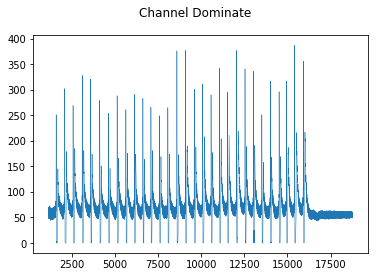

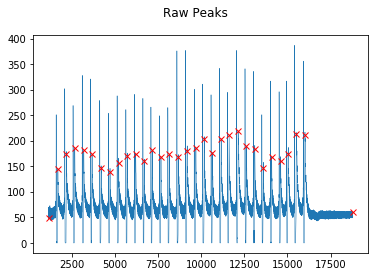

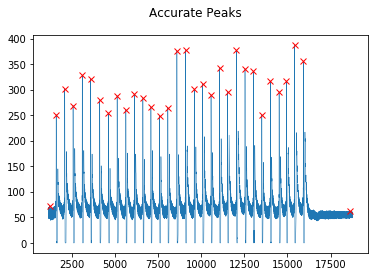

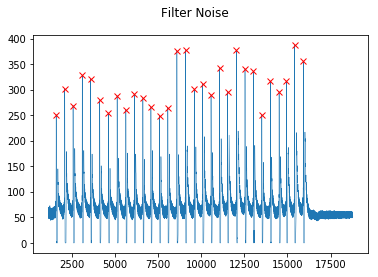

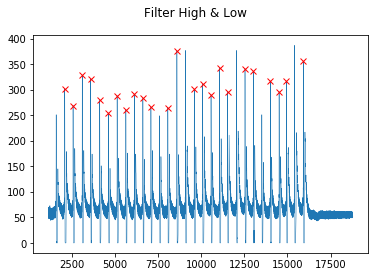

...

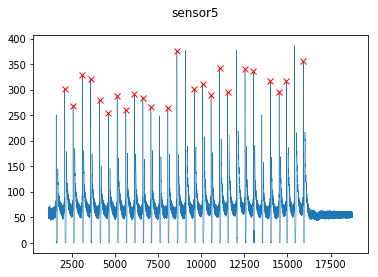

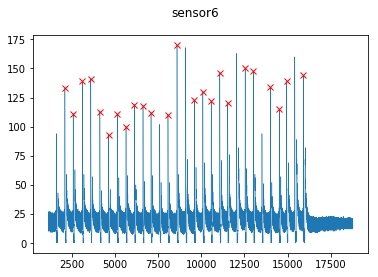

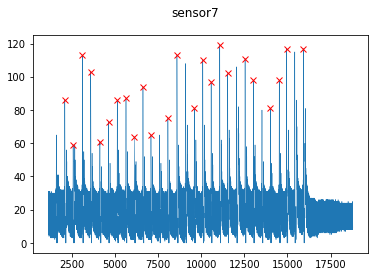

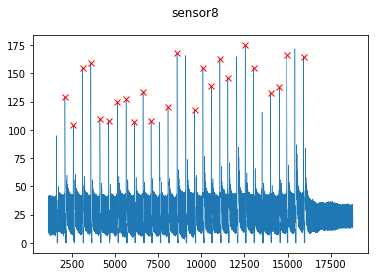

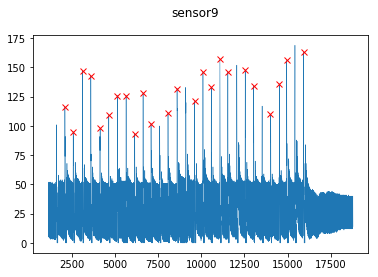

[[108.0, 100.0, 253.0, 283.0, 302.0, 133.0, 86.0, 129.0, 116.0], [106.0, 90.0, 287.0, 256.0, 269.0, 111.0, 59.0, 104.0, 95.0], [130.0, 94.0, 302.0, 309.0, 328.0, 139.0, 113.0, 155.0, 147.0], [120.0, 106.0, 306.0, 312.0, 321.0, 141.0, 103.0, 159.0, 143.0], [107.0, 97.0, 262.0, 276.0, 279.0, 113.0, 61.0, 110.0, 98.0], [109.0, 86.0, 245.0, 243.0, 254.0, 93.0, 73.0, 108.0, 109.0], [122.0, 92.0, 279.0, 270.0, 288.0, 111.0, 86.0, 125.0, 126.0], [115.0, 80.0, 304.0, 245.0, 261.0, 100.0, 87.0, 127.0, 126.0], [103.0, 96.0, 278.0, 262.0, 291.0, 119.0, 64.0, 107.0, 93.0], [110.0, 85.0, 280.0, 257.0, 283.0, 118.0, 94.0, 134.0, 128.0], [94.0, 90.0, 285.0, 237.0, 266.0, 112.0, 65.0, 108.0, 102.0], [98.0, 89.0, 270.0, 229.0, 265.0, 110.0, 75.0, 120.0, 111.0], [130.0, 124.0, 308.0, 327.0, 376.0, 170.0, 113.0, 168.0, 132.0], [125.0, 104.0, 284.0, 280.0, 301.0, 123.0, 81.0, 118.0, 121.0], [130.0, 94.0, 345.0, 282.0, 311.0, 130.0, 110.0, 155.0, 146.0], [111.0, 96.0, 280.0, 250.0, 290.0, 122.0, 97.0, 139.

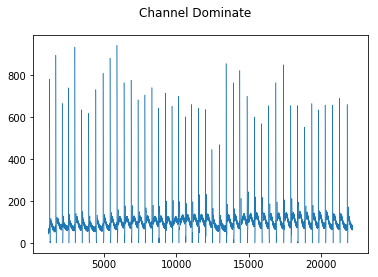

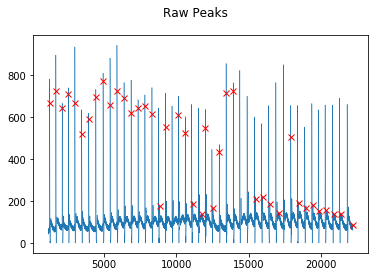

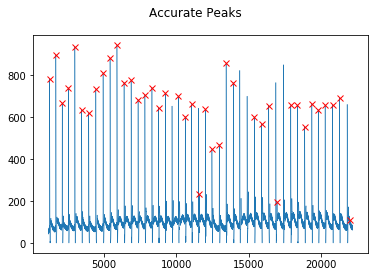

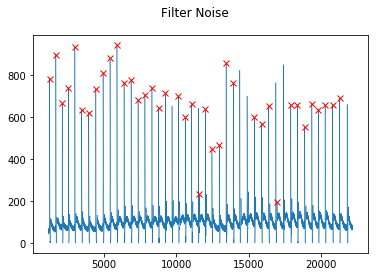

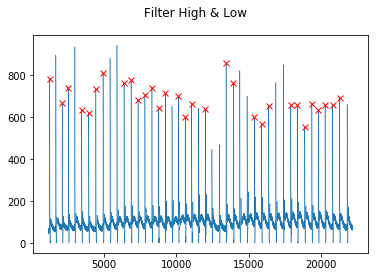

...

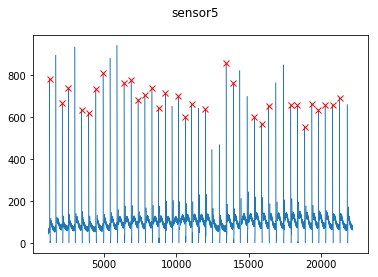

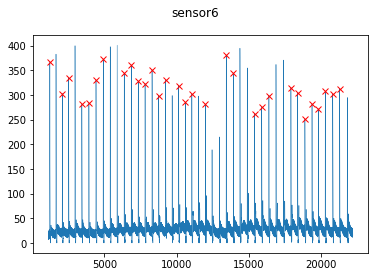

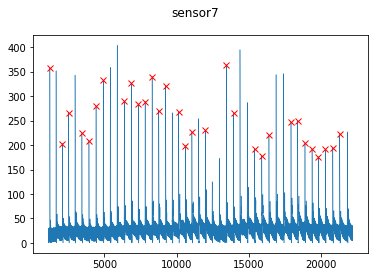

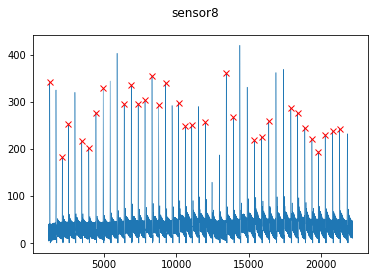

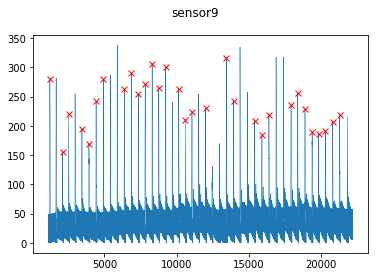

[[211.0, 218.0, 365.0, 540.0, 782.0, 366.0, 357.0, 341.0, 280.0], [153.0, 166.0, 366.0, 624.0, 666.0, 303.0, 203.0, 182.0, 155.0], [191.0, 195.0, 400.0, 658.0, 740.0, 335.0, 266.0, 253.0, 221.0], [171.0, 174.0, 465.0, 701.0, 635.0, 281.0, 224.0, 216.0, 195.0], [155.0, 166.0, 391.0, 604.0, 619.0, 283.0, 208.0, 202.0, 169.0], [201.0, 203.0, 426.0, 706.0, 732.0, 330.0, 279.0, 277.0, 242.0], [219.0, 220.0, 482.0, 719.0, 810.0, 373.0, 332.0, 329.0, 280.0], [242.0, 257.0, 607.0, 722.0, 765.0, 344.0, 290.0, 295.0, 263.0], [228.0, 259.0, 666.0, 721.0, 777.0, 361.0, 326.0, 336.0, 290.0], [212.0, 233.0, 515.0, 718.0, 683.0, 328.0, 284.0, 296.0, 255.0], [243.0, 249.0, 586.0, 719.0, 706.0, 323.0, 289.0, 303.0, 272.0], [245.0, 261.0, 668.0, 720.0, 741.0, 351.0, 340.0, 355.0, 306.0], [227.0, 243.0, 567.0, 718.0, 644.0, 299.0, 270.0, 293.0, 265.0], [256.0, 259.0, 651.0, 708.0, 715.0, 330.0, 321.0, 339.0, 301.0], [236.0, 261.0, 767.0, 723.0, 700.0, 319.0, 268.0, 297.0, 264.0], [177.0, 215.0, 543.0, 69

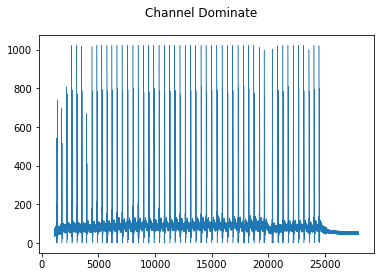

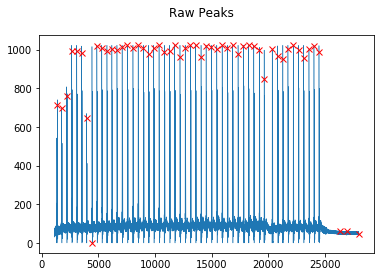

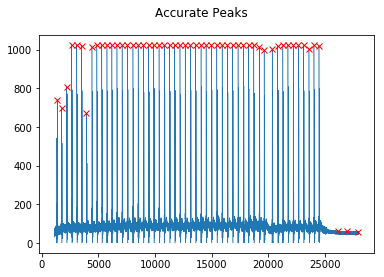

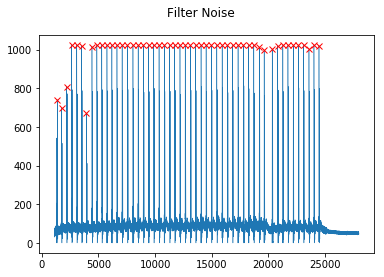

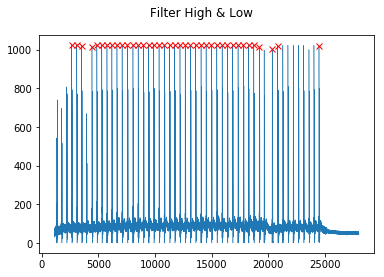

...

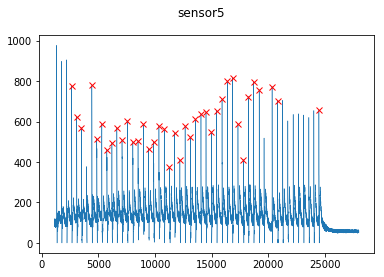

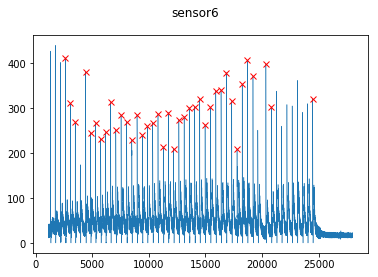

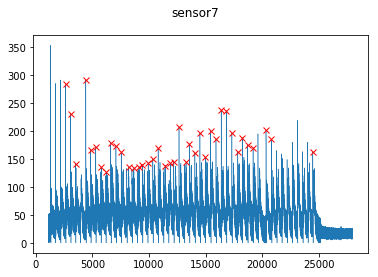

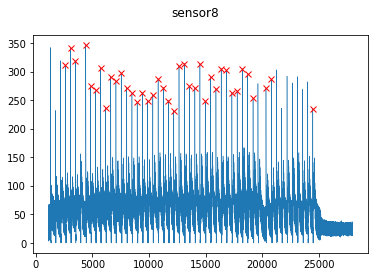

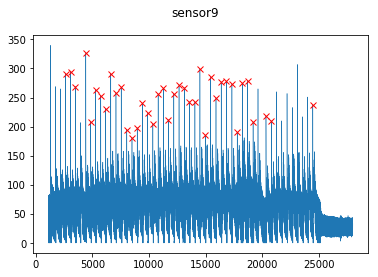

[[315.0, 854.0, 1023.0, 724.0, 776.0, 412.0, 283.0, 311.0, 291.0], [316.0, 853.0, 1023.0, 691.0, 624.0, 311.0, 231.0, 341.0, 294.0], [290.0, 844.0, 1019.0, 709.0, 570.0, 269.0, 141.0, 319.0, 269.0], [336.0, 861.0, 1016.0, 557.0, 779.0, 381.0, 291.0, 346.0, 326.0], [266.0, 838.0, 1023.0, 637.0, 516.0, 245.0, 166.0, 274.0, 208.0], [320.0, 849.0, 1023.0, 761.0, 588.0, 266.0, 171.0, 267.0, 263.0], [312.0, 853.0, 1023.0, 619.0, 462.0, 232.0, 135.0, 306.0, 253.0], [297.0, 850.0, 1023.0, 674.0, 496.0, 246.0, 126.0, 236.0, 231.0], [308.0, 854.0, 1023.0, 613.0, 570.0, 313.0, 178.0, 291.0, 291.0], [321.0, 858.0, 1023.0, 629.0, 508.0, 251.0, 173.0, 283.0, 258.0], [265.0, 840.0, 1023.0, 640.0, 604.0, 285.0, 162.0, 297.0, 268.0], [269.0, 843.0, 1023.0, 665.0, 498.0, 269.0, 135.0, 272.0, 195.0], [259.0, 840.0, 1023.0, 655.0, 504.0, 229.0, 134.0, 262.0, 181.0], [260.0, 840.0, 1023.0, 685.0, 587.0, 285.0, 136.0, 246.0, 198.0], [311.0, 855.0, 1023.0, 609.0, 466.0, 240.0, 140.0, 263.0, 240.0], [323.0, 8

In [5]:
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l3f1.txt"
l3f1 = dataProcess(file,500,80,20)
print(l3f1)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l3f2.txt"
l3f2 = dataProcess(file,500,80,20)
print(l3f2)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l3f3.txt"
l3f3 = dataProcess(file,500,80,20)
print(l3f3)

(9624, 10)
5


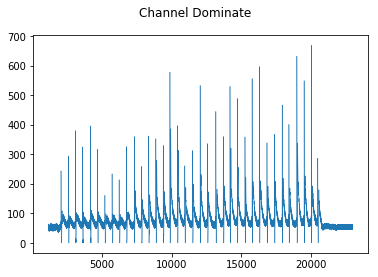

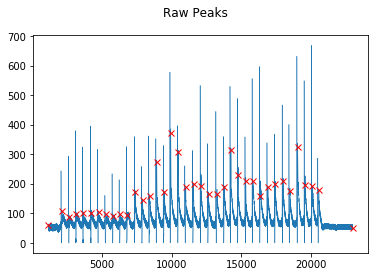

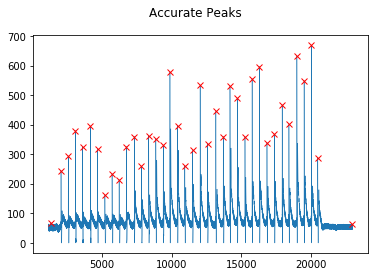

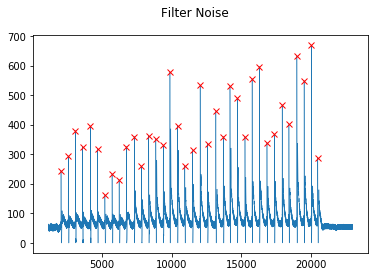

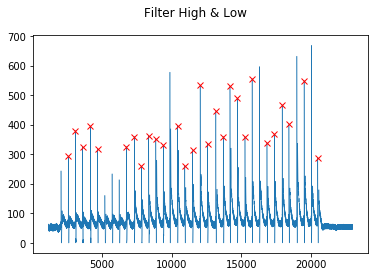

...

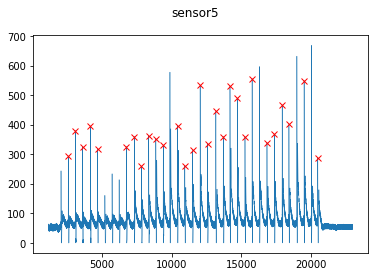

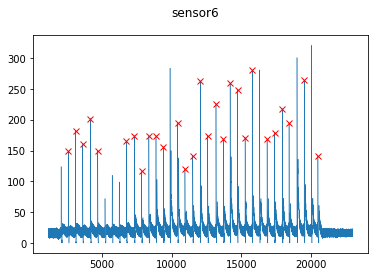

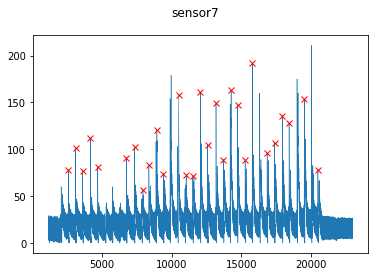

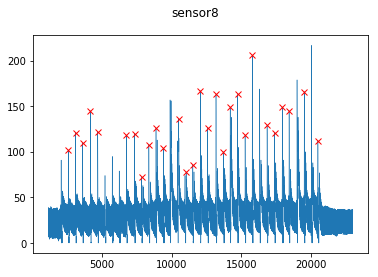

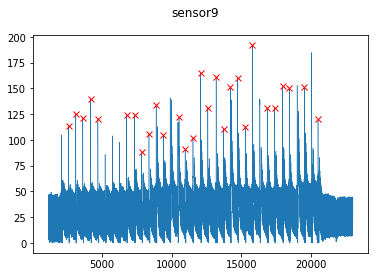

[[129.0, 107.0, 77.0, 129.0, 294.0, 149.0, 78.0, 102.0, 114.0], [127.0, 109.0, 92.0, 130.0, 380.0, 182.0, 101.0, 121.0, 125.0], [123.0, 109.0, 87.0, 150.0, 325.0, 160.0, 77.0, 110.0, 121.0], [132.0, 113.0, 89.0, 141.0, 396.0, 202.0, 112.0, 145.0, 140.0], [120.0, 98.0, 85.0, 130.0, 317.0, 150.0, 81.0, 122.0, 120.0], [129.0, 111.0, 96.0, 164.0, 326.0, 165.0, 91.0, 118.0, 124.0], [126.0, 109.0, 97.0, 257.0, 360.0, 174.0, 102.0, 120.0, 124.0], [102.0, 88.0, 82.0, 178.0, 259.0, 116.0, 57.0, 72.0, 88.0], [111.0, 102.0, 90.0, 214.0, 362.0, 173.0, 83.0, 108.0, 106.0], [133.0, 120.0, 109.0, 417.0, 353.0, 173.0, 121.0, 126.0, 134.0], [111.0, 100.0, 92.0, 236.0, 330.0, 156.0, 74.0, 104.0, 105.0], [126.0, 116.0, 112.0, 481.0, 397.0, 195.0, 158.0, 136.0, 122.0], [106.0, 97.0, 92.0, 259.0, 261.0, 120.0, 72.0, 78.0, 91.0], [114.0, 100.0, 93.0, 256.0, 313.0, 141.0, 71.0, 86.0, 102.0], [159.0, 131.0, 110.0, 372.0, 533.0, 263.0, 161.0, 167.0, 165.0], [135.0, 114.0, 88.0, 237.0, 336.0, 174.0, 105.0, 126.

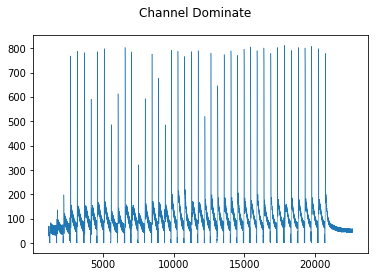

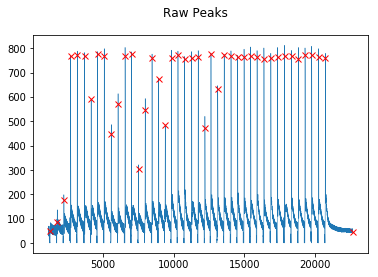

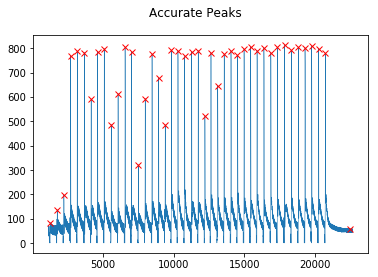

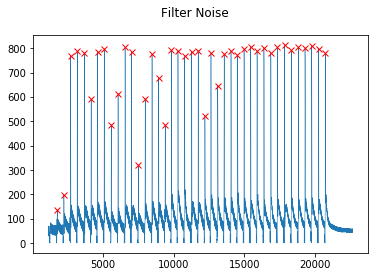

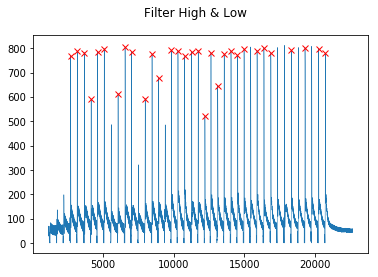

...

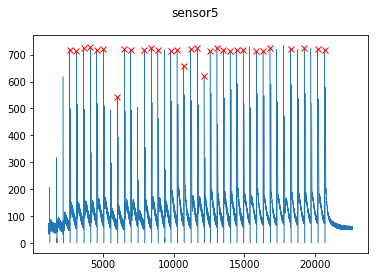

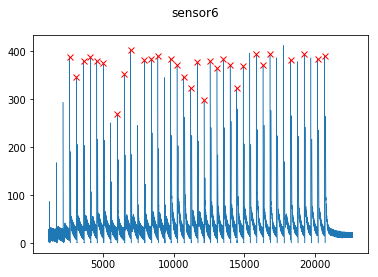

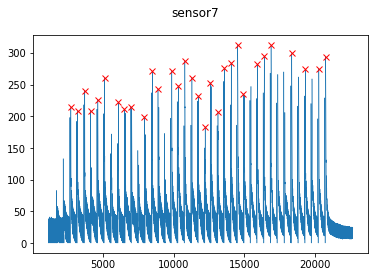

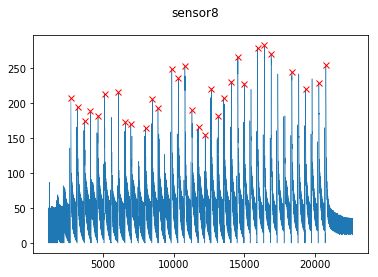

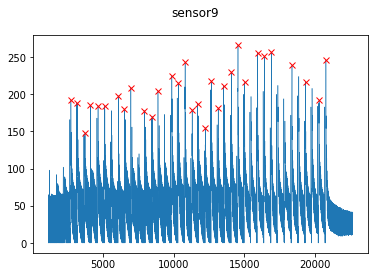

[[213.0, 434.0, 286.0, 768.0, 719.0, 388.0, 214.0, 207.0, 192.0], [217.0, 396.0, 270.0, 788.0, 712.0, 347.0, 208.0, 194.0, 188.0], [176.0, 375.0, 290.0, 782.0, 726.0, 381.0, 240.0, 174.0, 148.0], [224.0, 388.0, 238.0, 591.0, 728.0, 389.0, 208.0, 189.0, 185.0], [208.0, 340.0, 231.0, 786.0, 717.0, 380.0, 226.0, 182.0, 184.0], [176.0, 290.0, 245.0, 798.0, 721.0, 376.0, 260.0, 213.0, 184.0], [169.0, 219.0, 208.0, 613.0, 543.0, 270.0, 222.0, 216.0, 198.0], [226.0, 447.0, 278.0, 803.0, 720.0, 352.0, 211.0, 173.0, 180.0], [245.0, 422.0, 277.0, 785.0, 719.0, 403.0, 215.0, 170.0, 209.0], [214.0, 359.0, 250.0, 593.0, 719.0, 382.0, 199.0, 165.0, 178.0], [190.0, 375.0, 295.0, 776.0, 726.0, 385.0, 271.0, 206.0, 170.0], [230.0, 419.0, 275.0, 677.0, 717.0, 391.0, 243.0, 193.0, 204.0], [221.0, 343.0, 250.0, 792.0, 713.0, 385.0, 271.0, 249.0, 225.0], [227.0, 394.0, 266.0, 788.0, 717.0, 372.0, 248.0, 236.0, 215.0], [223.0, 270.0, 239.0, 766.0, 659.0, 347.0, 287.0, 253.0, 243.0], [169.0, 370.0, 276.0, 78

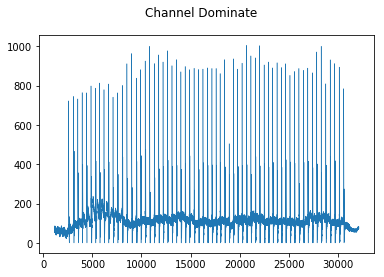

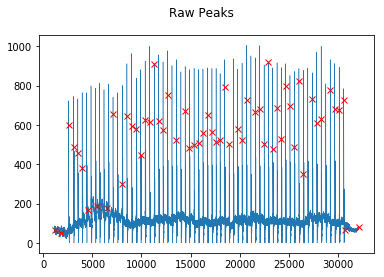

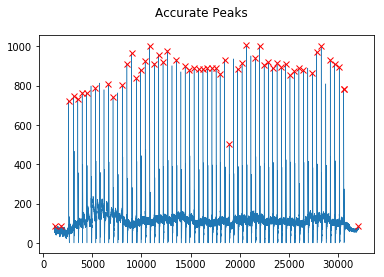

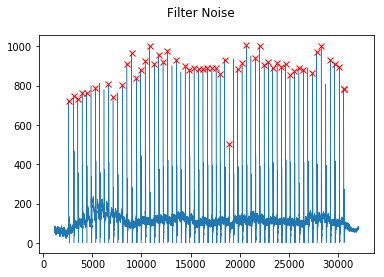

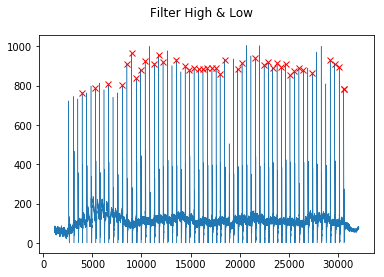

...

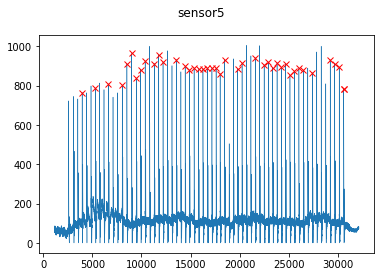

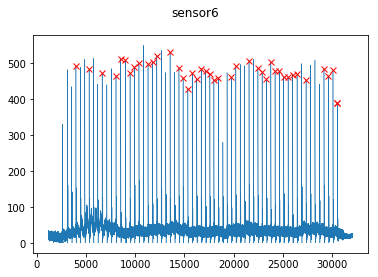

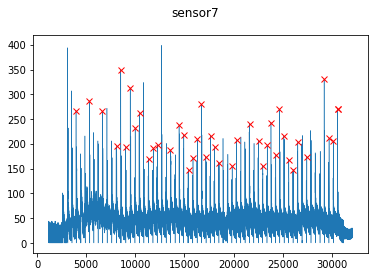

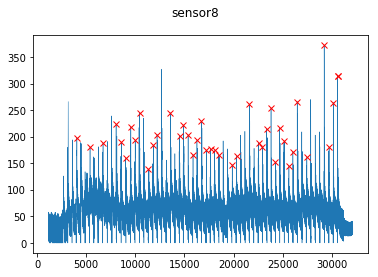

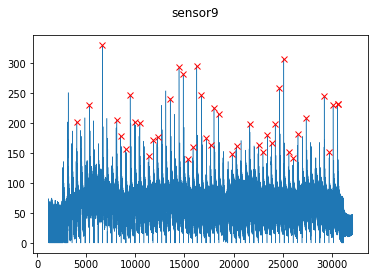

[[271.0, 814.0, 516.0, 865.0, 765.0, 493.0, 267.0, 198.0, 202.0], [316.0, 724.0, 657.0, 761.0, 788.0, 484.0, 287.0, 180.0, 231.0], [293.0, 533.0, 696.0, 763.0, 809.0, 472.0, 266.0, 188.0, 330.0], [264.0, 536.0, 525.0, 759.0, 802.0, 465.0, 195.0, 223.0, 205.0], [269.0, 568.0, 449.0, 921.0, 912.0, 513.0, 349.0, 189.0, 179.0], [273.0, 817.0, 487.0, 920.0, 964.0, 508.0, 193.0, 159.0, 156.0], [286.0, 822.0, 566.0, 909.0, 839.0, 474.0, 313.0, 218.0, 247.0], [341.0, 846.0, 612.0, 911.0, 882.0, 490.0, 232.0, 193.0, 202.0], [325.0, 842.0, 675.0, 967.0, 926.0, 500.0, 262.0, 245.0, 201.0], [364.0, 866.0, 492.0, 902.0, 913.0, 497.0, 169.0, 139.0, 145.0], [288.0, 811.0, 517.0, 945.0, 957.0, 503.0, 191.0, 184.0, 172.0], [249.0, 798.0, 539.0, 949.0, 921.0, 519.0, 198.0, 204.0, 177.0], [287.0, 811.0, 622.0, 947.0, 933.0, 531.0, 188.0, 245.0, 241.0], [285.0, 641.0, 434.0, 934.0, 898.0, 487.0, 238.0, 202.0, 293.0], [343.0, 845.0, 675.0, 955.0, 882.0, 460.0, 218.0, 222.0, 282.0], [207.0, 616.0, 425.0, 69

In [6]:
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l4f1.txt"
l4f1 = dataProcess(file,500,80,20)
print(l4f1)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l4f2.txt"
l4f2 = dataProcess(file,500,80,20)
print(l4f2)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l4f3.txt"
l4f3 = dataProcess(file,500,80,20)
print(l4f3)

(10641, 10)
5


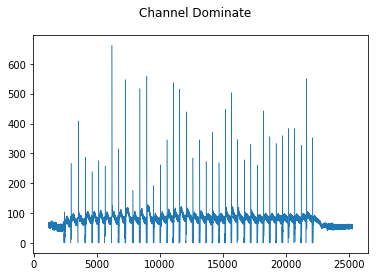

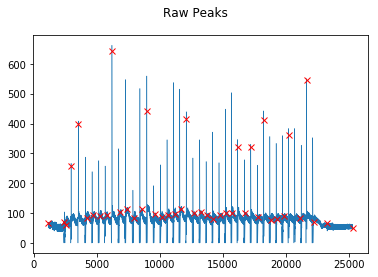

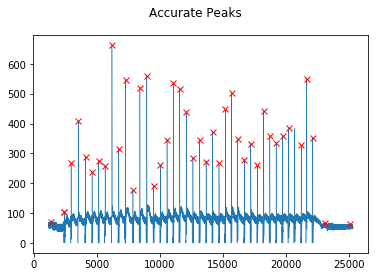

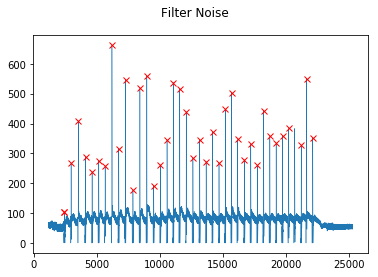

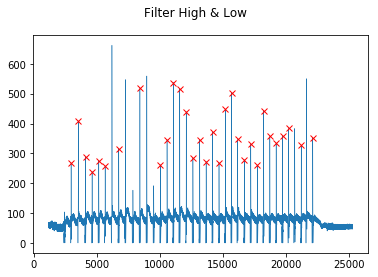

...

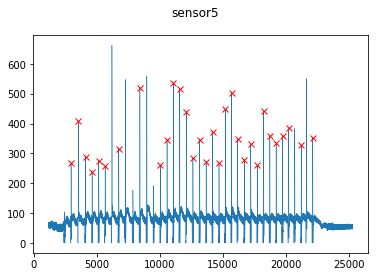

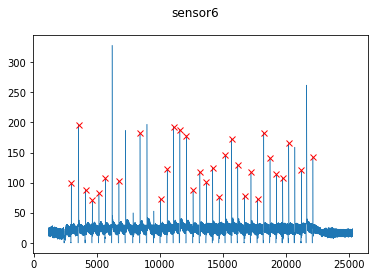

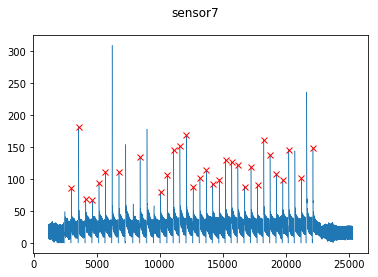

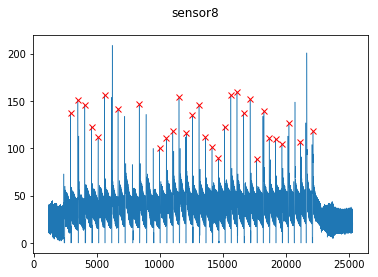

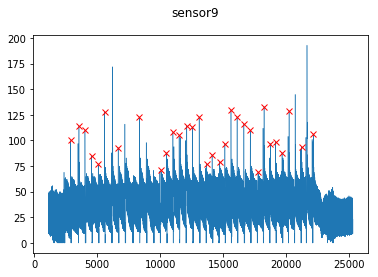

[[96.0, 84.0, 120.0, 304.0, 267.0, 99.0, 86.0, 137.0, 100.0], [107.0, 94.0, 109.0, 289.0, 409.0, 196.0, 181.0, 151.0, 114.0], [97.0, 66.0, 98.0, 288.0, 288.0, 88.0, 68.0, 146.0, 110.0], [92.0, 77.0, 118.0, 231.0, 239.0, 71.0, 67.0, 123.0, 85.0], [69.0, 67.0, 93.0, 218.0, 276.0, 82.0, 94.0, 112.0, 77.0], [106.0, 73.0, 111.0, 284.0, 258.0, 107.0, 111.0, 156.0, 128.0], [89.0, 75.0, 117.0, 265.0, 316.0, 103.0, 111.0, 142.0, 93.0], [114.0, 81.0, 120.0, 296.0, 518.0, 182.0, 134.0, 147.0, 123.0], [76.0, 80.0, 107.0, 178.0, 262.0, 73.0, 79.0, 100.0, 71.0], [88.0, 89.0, 112.0, 212.0, 346.0, 122.0, 106.0, 111.0, 88.0], [108.0, 89.0, 126.0, 228.0, 538.0, 193.0, 146.0, 118.0, 108.0], [93.0, 84.0, 97.0, 302.0, 516.0, 188.0, 151.0, 154.0, 105.0], [109.0, 95.0, 117.0, 215.0, 440.0, 178.0, 168.0, 116.0, 114.0], [111.0, 89.0, 124.0, 256.0, 285.0, 87.0, 88.0, 135.0, 113.0], [107.0, 70.0, 108.0, 269.0, 346.0, 118.0, 101.0, 146.0, 123.0], [77.0, 68.0, 102.0, 205.0, 273.0, 101.0, 114.0, 112.0, 77.0], [82.0

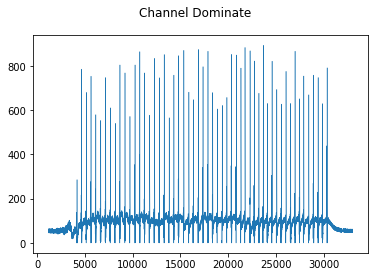

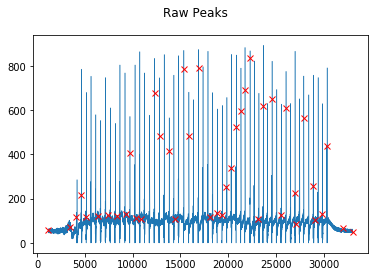

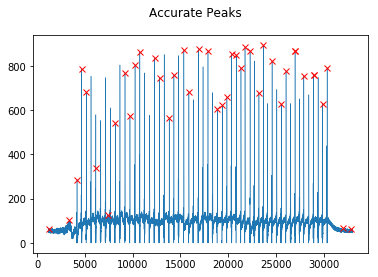

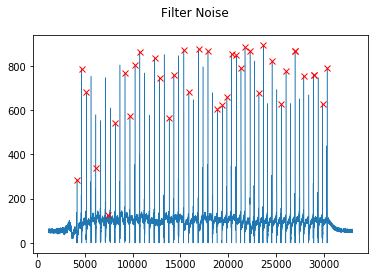

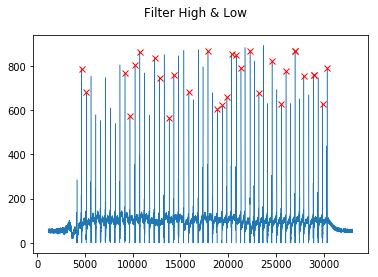

...

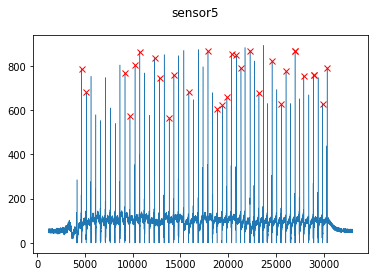

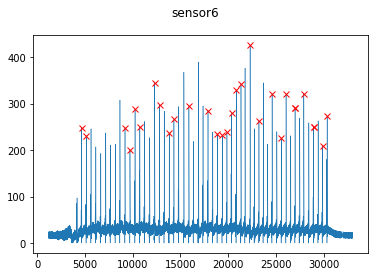

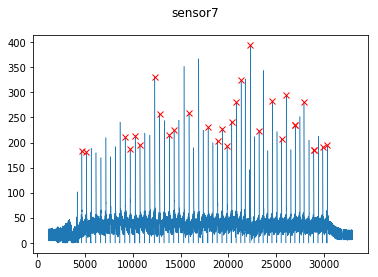

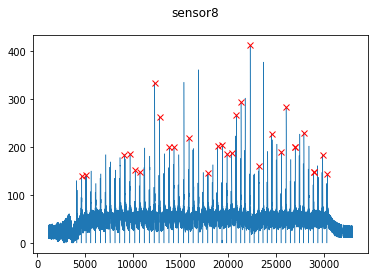

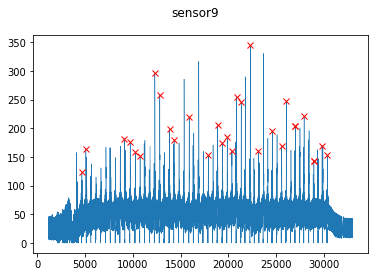

[[116.0, 99.0, 144.0, 180.0, 786.0, 248.0, 184.0, 139.0, 123.0], [156.0, 114.0, 126.0, 195.0, 681.0, 231.0, 182.0, 142.0, 164.0], [138.0, 127.0, 148.0, 380.0, 769.0, 248.0, 211.0, 184.0, 182.0], [148.0, 131.0, 153.0, 185.0, 572.0, 200.0, 188.0, 186.0, 176.0], [153.0, 110.0, 136.0, 226.0, 805.0, 288.0, 214.0, 151.0, 159.0], [152.0, 129.0, 177.0, 267.0, 865.0, 250.0, 196.0, 147.0, 152.0], [237.0, 216.0, 195.0, 359.0, 835.0, 344.0, 331.0, 333.0, 296.0], [230.0, 173.0, 167.0, 325.0, 747.0, 298.0, 257.0, 263.0, 258.0], [187.0, 147.0, 140.0, 235.0, 566.0, 236.0, 216.0, 199.0, 199.0], [146.0, 128.0, 122.0, 272.0, 759.0, 266.0, 225.0, 199.0, 180.0], [206.0, 164.0, 146.0, 222.0, 682.0, 294.0, 259.0, 219.0, 220.0], [151.0, 116.0, 142.0, 374.0, 867.0, 285.0, 231.0, 145.0, 153.0], [190.0, 139.0, 138.0, 240.0, 606.0, 235.0, 204.0, 201.0, 205.0], [174.0, 144.0, 161.0, 174.0, 622.0, 232.0, 228.0, 205.0, 175.0], [168.0, 125.0, 126.0, 180.0, 658.0, 238.0, 193.0, 186.0, 184.0], [164.0, 127.0, 135.0, 228

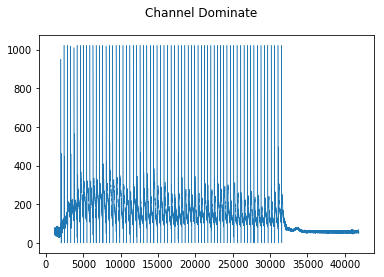

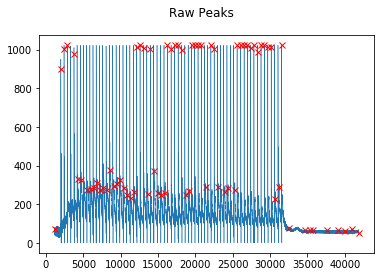

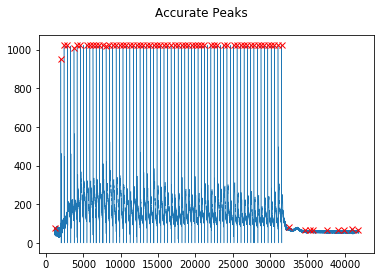

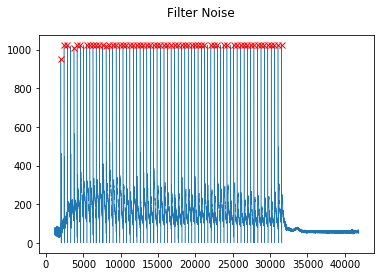

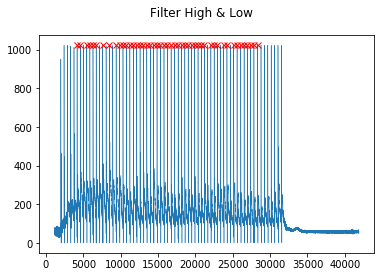

...

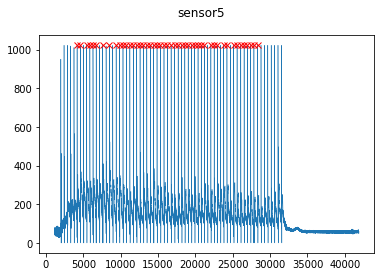

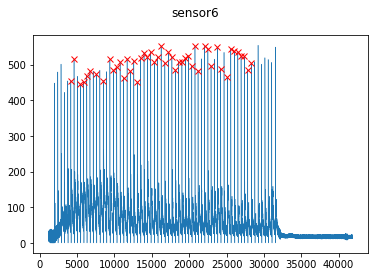

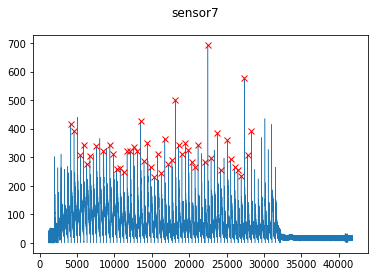

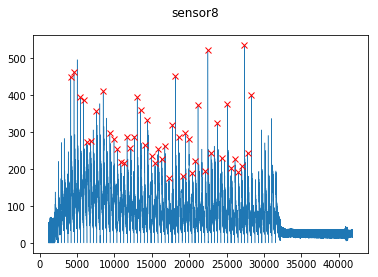

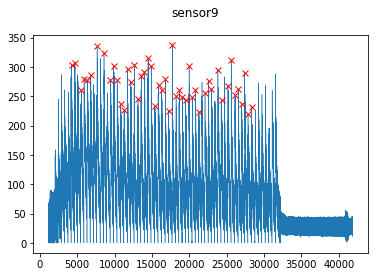

[[285.0, 249.0, 246.0, 783.0, 1023.0, 454.0, 417.0, 450.0, 303.0], [288.0, 304.0, 322.0, 787.0, 1023.0, 516.0, 393.0, 463.0, 306.0], [246.0, 218.0, 249.0, 761.0, 1023.0, 446.0, 309.0, 395.0, 260.0], [276.0, 225.0, 306.0, 759.0, 1023.0, 452.0, 343.0, 388.0, 279.0], [290.0, 234.0, 273.0, 784.0, 1023.0, 470.0, 277.0, 272.0, 277.0], [271.0, 241.0, 272.0, 794.0, 1023.0, 482.0, 305.0, 275.0, 286.0], [309.0, 273.0, 791.0, 813.0, 1023.0, 473.0, 341.0, 356.0, 335.0], [300.0, 271.0, 281.0, 774.0, 1023.0, 456.0, 323.0, 411.0, 324.0], [268.0, 236.0, 243.0, 773.0, 1023.0, 515.0, 344.0, 297.0, 278.0], [287.0, 251.0, 241.0, 790.0, 1023.0, 485.0, 312.0, 281.0, 301.0], [277.0, 300.0, 245.0, 820.0, 1023.0, 493.0, 259.0, 253.0, 278.0], [219.0, 313.0, 622.0, 941.0, 1023.0, 508.0, 261.0, 218.0, 236.0], [236.0, 241.0, 326.0, 845.0, 1023.0, 464.0, 249.0, 217.0, 227.0], [282.0, 217.0, 373.0, 845.0, 1023.0, 517.0, 322.0, 286.0, 297.0], [264.0, 267.0, 383.0, 864.0, 1023.0, 482.0, 322.0, 257.0, 275.0], [294.0, 2

In [7]:
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l5f1.txt"
l5f1 = dataProcess(file,500,80,20)
print(l5f1)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l5f2.txt"
l5f2 = dataProcess(file,500,80,20)
print(l5f2)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l5f3.txt"
l5f3 = dataProcess(file,500,80,20)
print(l5f3)

(10322, 10)
6


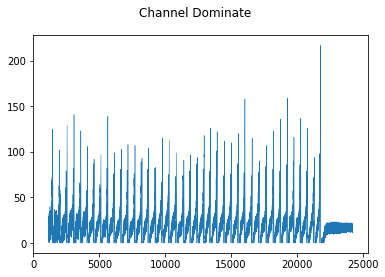

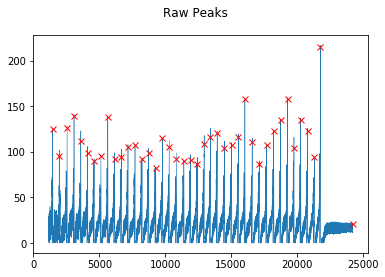

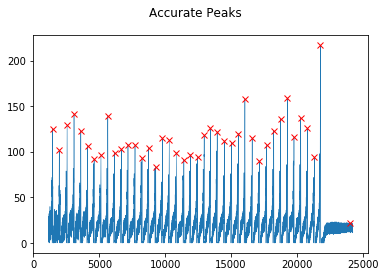

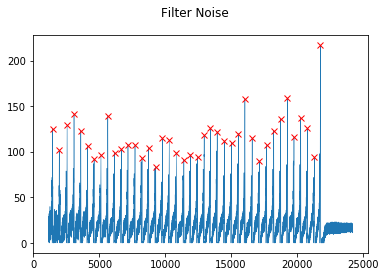

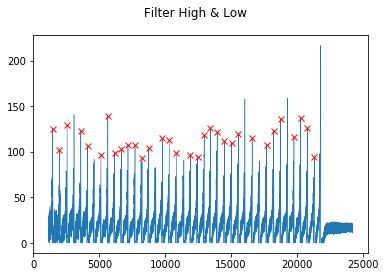

...

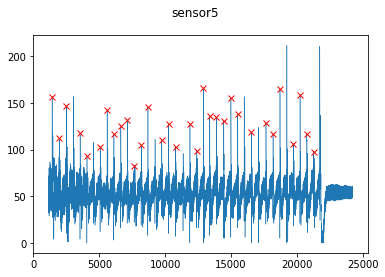

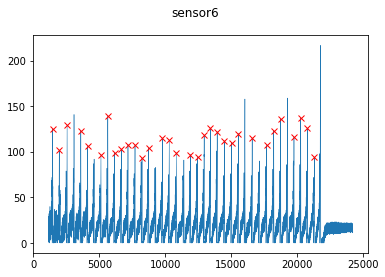

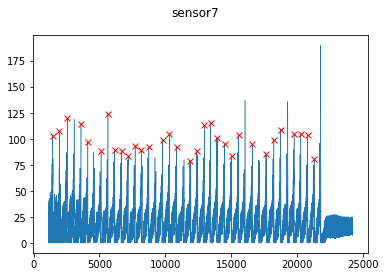

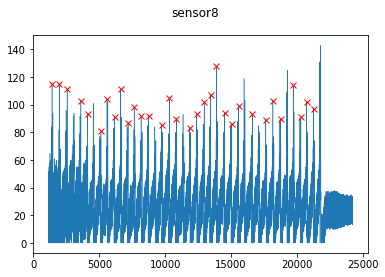

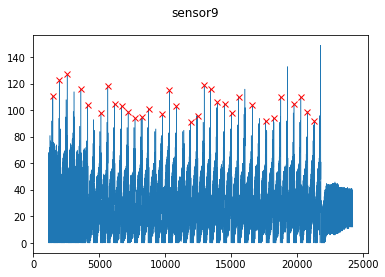

[[145.0, 141.0, 137.0, 160.0, 157.0, 125.0, 103.0, 115.0, 111.0], [115.0, 111.0, 108.0, 113.0, 112.0, 102.0, 108.0, 115.0, 123.0], [129.0, 110.0, 114.0, 155.0, 147.0, 129.0, 120.0, 111.0, 127.0], [115.0, 98.0, 104.0, 129.0, 118.0, 123.0, 114.0, 103.0, 116.0], [105.0, 91.0, 95.0, 118.0, 93.0, 106.0, 97.0, 93.0, 104.0], [94.0, 85.0, 92.0, 121.0, 103.0, 97.0, 88.0, 81.0, 98.0], [105.0, 105.0, 106.0, 141.0, 143.0, 139.0, 124.0, 104.0, 118.0], [105.0, 88.0, 94.0, 127.0, 117.0, 99.0, 89.0, 91.0, 105.0], [107.0, 91.0, 91.0, 122.0, 125.0, 103.0, 88.0, 111.0, 103.0], [112.0, 101.0, 97.0, 114.0, 132.0, 108.0, 84.0, 87.0, 99.0], [89.0, 89.0, 95.0, 115.0, 83.0, 107.0, 93.0, 98.0, 94.0], [105.0, 97.0, 97.0, 107.0, 105.0, 93.0, 89.0, 92.0, 95.0], [107.0, 90.0, 90.0, 111.0, 146.0, 104.0, 92.0, 92.0, 101.0], [101.0, 96.0, 97.0, 121.0, 110.0, 115.0, 99.0, 85.0, 97.0], [116.0, 98.0, 101.0, 114.0, 127.0, 113.0, 105.0, 105.0, 115.0], [97.0, 82.0, 91.0, 119.0, 103.0, 99.0, 92.0, 90.0, 103.0], [104.0, 94.0,

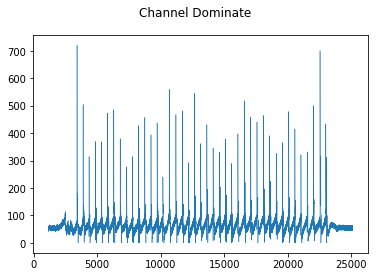

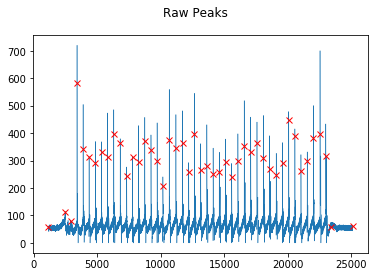

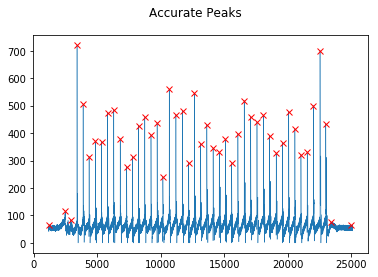

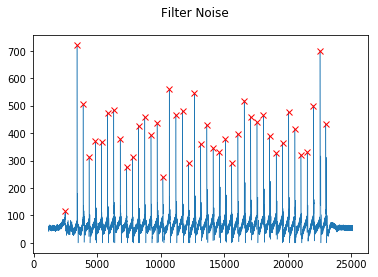

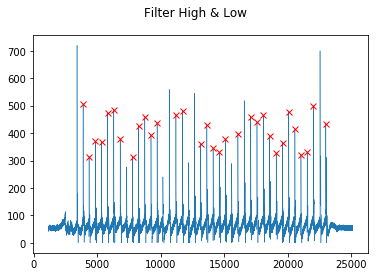

...

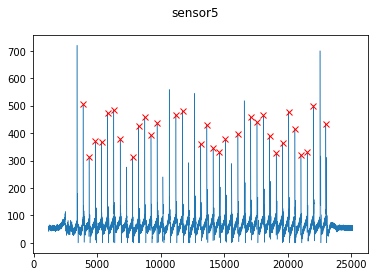

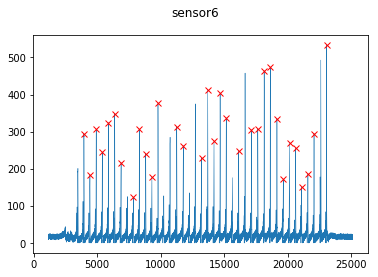

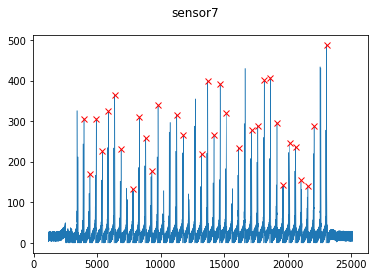

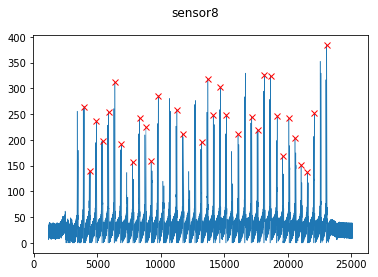

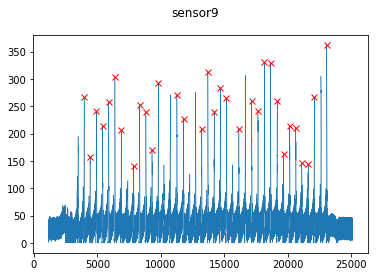

[[242.0, 218.0, 219.0, 188.0, 505.0, 294.0, 306.0, 265.0, 267.0], [181.0, 171.0, 162.0, 135.0, 315.0, 183.0, 170.0, 140.0, 158.0], [245.0, 233.0, 218.0, 173.0, 370.0, 306.0, 306.0, 237.0, 242.0], [221.0, 193.0, 175.0, 161.0, 369.0, 244.0, 226.0, 198.0, 214.0], [260.0, 240.0, 222.0, 173.0, 474.0, 324.0, 324.0, 254.0, 258.0], [275.0, 246.0, 246.0, 206.0, 486.0, 348.0, 364.0, 312.0, 304.0], [190.0, 187.0, 187.0, 152.0, 380.0, 216.0, 231.0, 192.0, 207.0], [153.0, 130.0, 131.0, 120.0, 315.0, 123.0, 133.0, 158.0, 141.0], [240.0, 230.0, 217.0, 170.0, 428.0, 306.0, 311.0, 242.0, 252.0], [225.0, 208.0, 207.0, 173.0, 458.0, 241.0, 258.0, 225.0, 240.0], [177.0, 170.0, 167.0, 139.0, 394.0, 177.0, 176.0, 159.0, 171.0], [298.0, 261.0, 231.0, 204.0, 438.0, 376.0, 339.0, 286.0, 293.0], [236.0, 233.0, 224.0, 178.0, 468.0, 313.0, 315.0, 259.0, 271.0], [215.0, 202.0, 191.0, 166.0, 482.0, 262.0, 266.0, 212.0, 227.0], [211.0, 178.0, 176.0, 155.0, 362.0, 229.0, 219.0, 196.0, 208.0], [266.0, 262.0, 247.0, 19

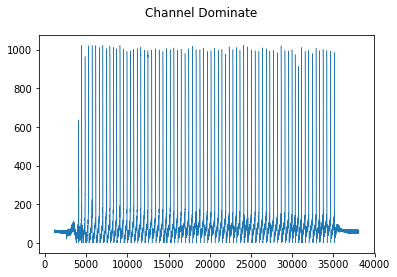

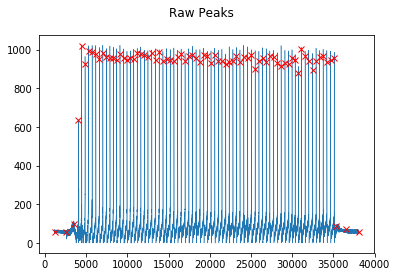

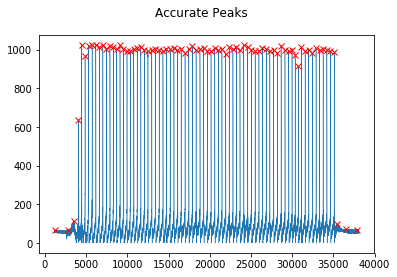

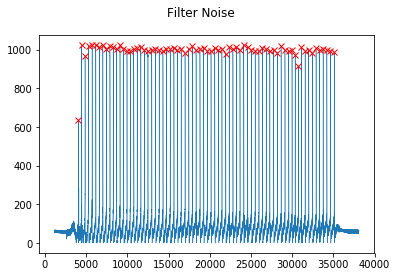

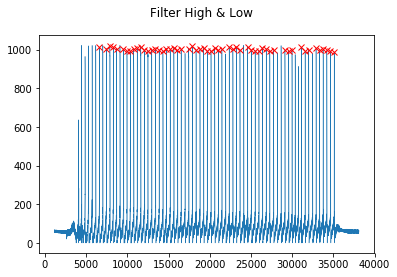

...

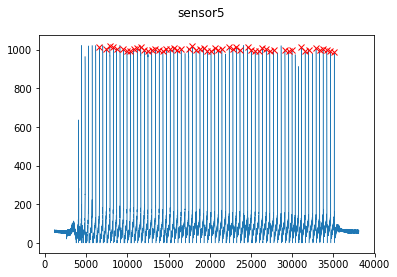

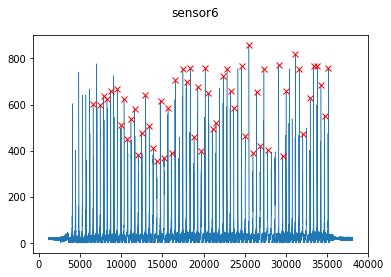

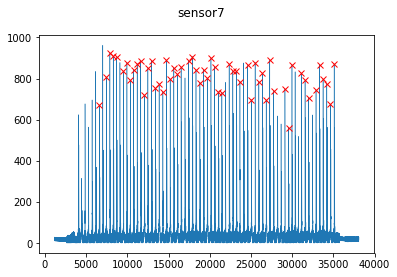

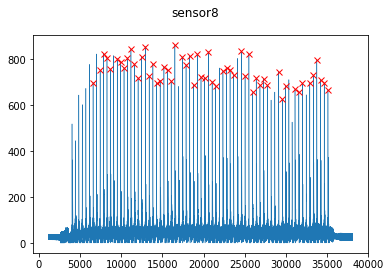

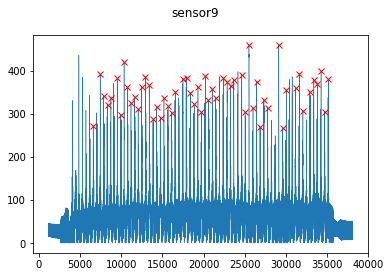

[[249.0, 322.0, 266.0, 808.0, 1012.0, 601.0, 671.0, 699.0, 271.0], [277.0, 283.0, 254.0, 791.0, 1006.0, 597.0, 806.0, 752.0, 392.0], [314.0, 282.0, 286.0, 811.0, 1019.0, 636.0, 923.0, 825.0, 341.0], [335.0, 266.0, 268.0, 792.0, 1013.0, 624.0, 909.0, 806.0, 321.0], [348.0, 256.0, 269.0, 770.0, 1005.0, 658.0, 903.0, 759.0, 337.0], [325.0, 325.0, 287.0, 782.0, 1004.0, 668.0, 836.0, 804.0, 382.0], [328.0, 249.0, 280.0, 735.0, 992.0, 511.0, 877.0, 790.0, 298.0], [297.0, 320.0, 271.0, 772.0, 994.0, 626.0, 792.0, 764.0, 419.0], [284.0, 245.0, 299.0, 775.0, 1003.0, 451.0, 841.0, 807.0, 361.0], [316.0, 300.0, 312.0, 759.0, 1007.0, 539.0, 872.0, 846.0, 324.0], [320.0, 280.0, 289.0, 805.0, 1014.0, 582.0, 885.0, 779.0, 338.0], [259.0, 237.0, 243.0, 744.0, 998.0, 383.0, 718.0, 719.0, 311.0], [298.0, 260.0, 290.0, 759.0, 995.0, 478.0, 849.0, 812.0, 363.0], [314.0, 342.0, 298.0, 755.0, 999.0, 641.0, 886.0, 856.0, 386.0], [291.0, 271.0, 247.0, 778.0, 1005.0, 509.0, 753.0, 726.0, 367.0], [316.0, 314.0,

In [8]:
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l6f1.txt"
l6f1 = dataProcess(file,500,80,20)
print(l6f1)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l6f2.txt"
l6f2 = dataProcess(file,500,80,20)
print(l6f2)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l6f3.txt"
l6f3 = dataProcess(file,500,80,20)
print(l6f3)

(11214, 10)
7


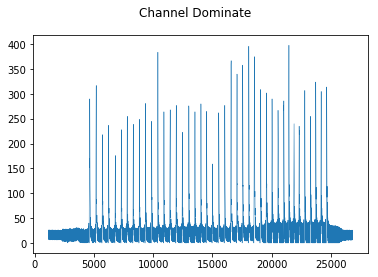

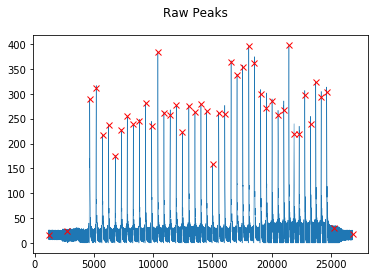

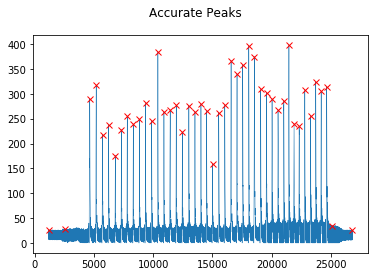

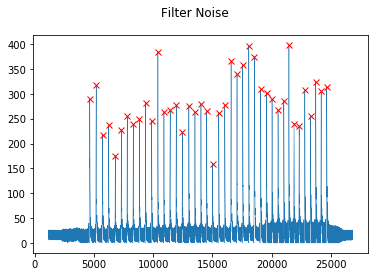

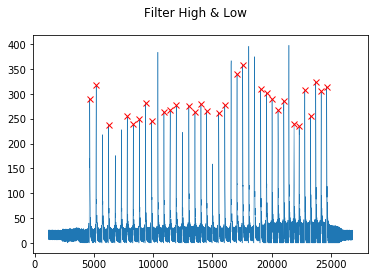

...

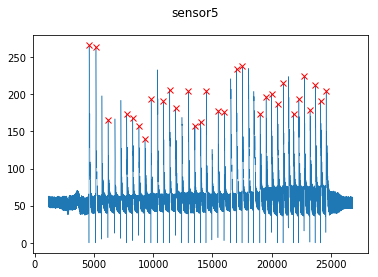

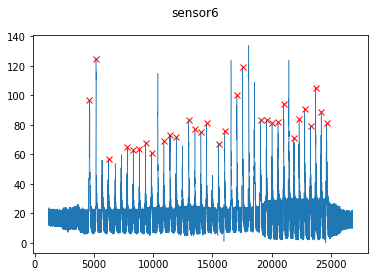

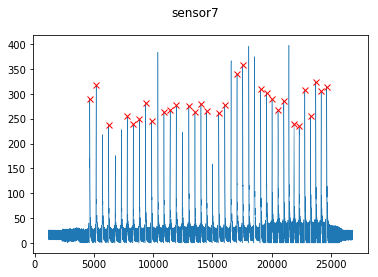

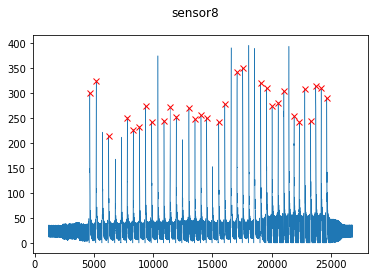

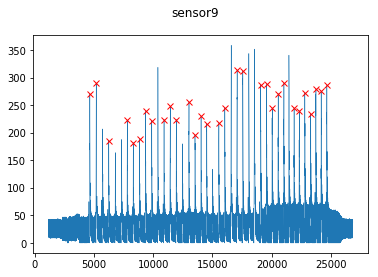

[[224.0, 196.0, 187.0, 324.0, 266.0, 97.0, 290.0, 301.0, 270.0], [243.0, 227.0, 204.0, 309.0, 264.0, 125.0, 317.0, 325.0, 290.0], [176.0, 154.0, 130.0, 201.0, 166.0, 57.0, 237.0, 214.0, 186.0], [178.0, 153.0, 149.0, 223.0, 173.0, 65.0, 255.0, 251.0, 223.0], [174.0, 159.0, 139.0, 194.0, 168.0, 63.0, 239.0, 227.0, 182.0], [184.0, 162.0, 141.0, 174.0, 158.0, 64.0, 249.0, 233.0, 188.0], [186.0, 162.0, 156.0, 185.0, 140.0, 68.0, 281.0, 274.0, 239.0], [186.0, 152.0, 150.0, 252.0, 193.0, 61.0, 245.0, 243.0, 222.0], [206.0, 173.0, 151.0, 238.0, 191.0, 69.0, 264.0, 245.0, 224.0], [210.0, 174.0, 168.0, 244.0, 206.0, 73.0, 268.0, 273.0, 248.0], [212.0, 180.0, 153.0, 198.0, 181.0, 72.0, 277.0, 253.0, 224.0], [231.0, 198.0, 170.0, 264.0, 204.0, 83.0, 276.0, 271.0, 256.0], [183.0, 164.0, 144.0, 198.0, 158.0, 77.0, 264.0, 248.0, 196.0], [213.0, 181.0, 154.0, 210.0, 163.0, 75.0, 280.0, 256.0, 230.0], [208.0, 183.0, 157.0, 219.0, 205.0, 81.0, 265.0, 251.0, 216.0], [203.0, 172.0, 147.0, 200.0, 178.0, 67

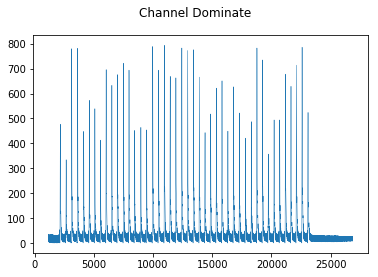

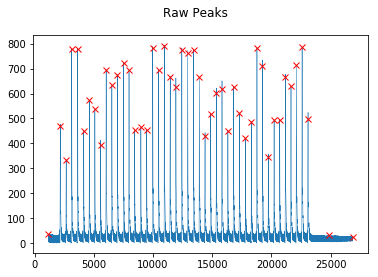

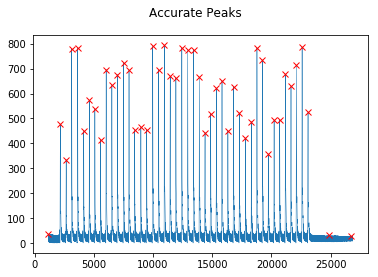

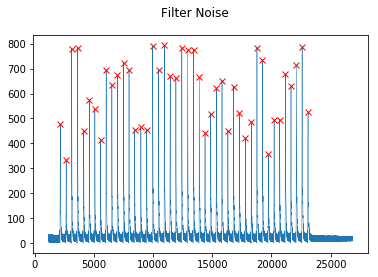

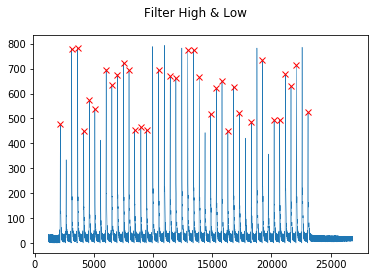

...

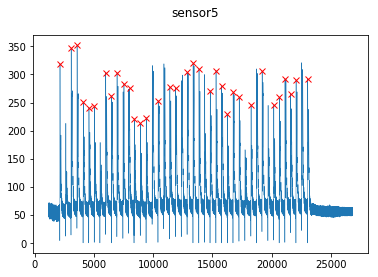

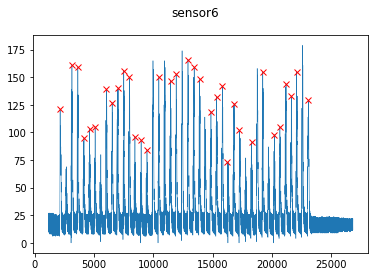

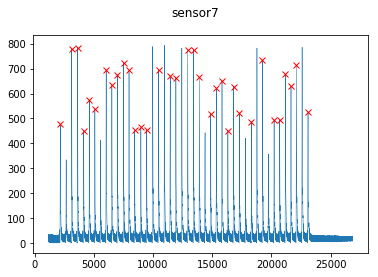

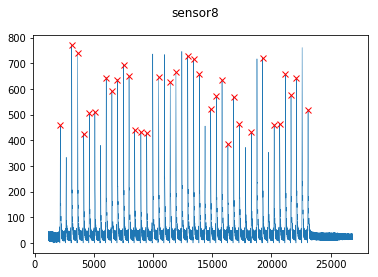

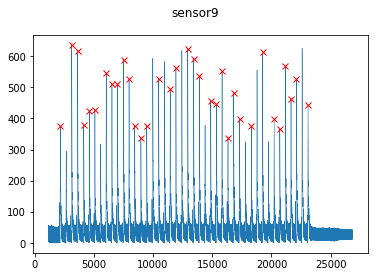

[[342.0, 319.0, 286.0, 386.0, 319.0, 121.0, 477.0, 458.0, 374.0], [488.0, 450.0, 414.0, 444.0, 347.0, 161.0, 780.0, 771.0, 635.0], [467.0, 427.0, 394.0, 461.0, 352.0, 159.0, 782.0, 740.0, 615.0], [333.0, 287.0, 253.0, 330.0, 251.0, 95.0, 448.0, 426.0, 378.0], [353.0, 291.0, 274.0, 330.0, 241.0, 103.0, 573.0, 505.0, 425.0], [337.0, 291.0, 280.0, 332.0, 243.0, 105.0, 539.0, 511.0, 427.0], [455.0, 378.0, 352.0, 403.0, 303.0, 139.0, 696.0, 645.0, 545.0], [434.0, 369.0, 334.0, 358.0, 262.0, 127.0, 633.0, 592.0, 511.0], [471.0, 433.0, 379.0, 372.0, 303.0, 140.0, 676.0, 637.0, 510.0], [464.0, 402.0, 383.0, 363.0, 283.0, 156.0, 722.0, 695.0, 589.0], [447.0, 423.0, 380.0, 324.0, 275.0, 150.0, 694.0, 651.0, 528.0], [300.0, 262.0, 250.0, 290.0, 221.0, 96.0, 452.0, 440.0, 377.0], [271.0, 262.0, 240.0, 262.0, 213.0, 93.0, 464.0, 432.0, 338.0], [324.0, 274.0, 245.0, 309.0, 223.0, 84.0, 454.0, 428.0, 376.0], [410.0, 380.0, 355.0, 342.0, 253.0, 150.0, 694.0, 647.0, 528.0], [410.0, 389.0, 354.0, 335.0,

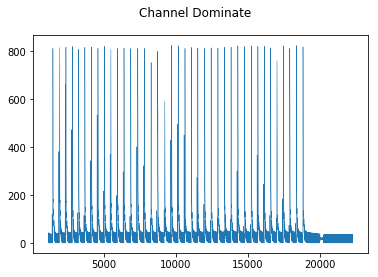

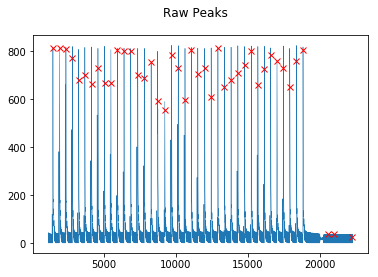

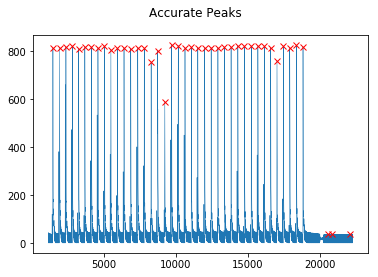

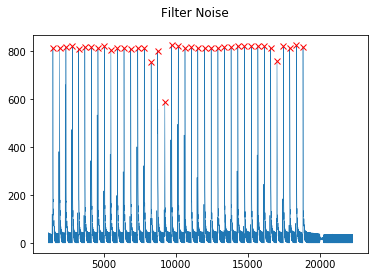

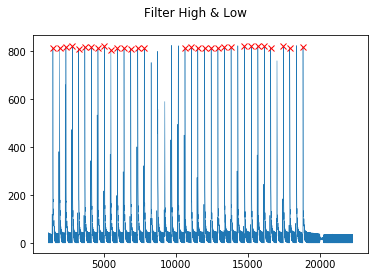

...

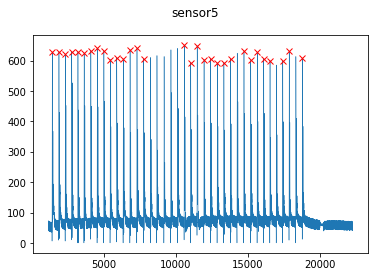

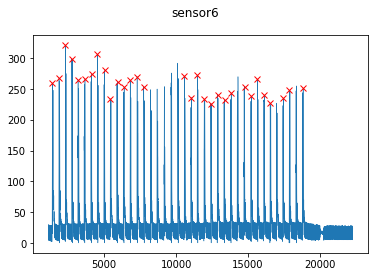

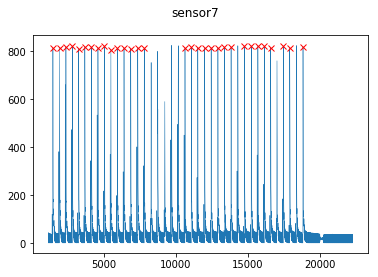

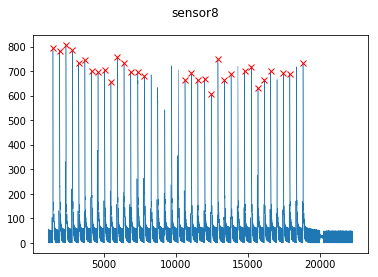

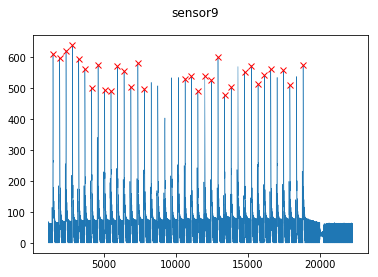

[[547.0, 458.0, 359.0, 783.0, 628.0, 259.0, 812.0, 793.0, 611.0], [535.0, 441.0, 345.0, 802.0, 629.0, 267.0, 815.0, 783.0, 598.0], [538.0, 516.0, 413.0, 810.0, 621.0, 321.0, 817.0, 806.0, 622.0], [488.0, 500.0, 463.0, 799.0, 630.0, 299.0, 820.0, 785.0, 639.0], [493.0, 467.0, 397.0, 781.0, 629.0, 264.0, 808.0, 735.0, 594.0], [446.0, 487.0, 421.0, 767.0, 624.0, 266.0, 816.0, 746.0, 562.0], [435.0, 481.0, 423.0, 769.0, 633.0, 274.0, 818.0, 700.0, 502.0], [438.0, 502.0, 397.0, 810.0, 641.0, 306.0, 812.0, 696.0, 576.0], [444.0, 429.0, 397.0, 790.0, 632.0, 280.0, 821.0, 704.0, 493.0], [437.0, 374.0, 327.0, 797.0, 604.0, 234.0, 807.0, 657.0, 491.0], [417.0, 449.0, 397.0, 786.0, 610.0, 261.0, 812.0, 758.0, 571.0], [420.0, 474.0, 400.0, 784.0, 606.0, 253.0, 813.0, 733.0, 555.0], [448.0, 505.0, 449.0, 771.0, 636.0, 264.0, 811.0, 697.0, 505.0], [443.0, 542.0, 446.0, 786.0, 641.0, 270.0, 812.0, 696.0, 580.0], [449.0, 459.0, 383.0, 793.0, 606.0, 253.0, 812.0, 681.0, 498.0], [431.0, 489.0, 464.0, 78

In [9]:
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l7f1.txt"
l7f1 = dataProcess(file,500,80,20)
print(l7f1)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l7f2.txt"
l7f2 = dataProcess(file,500,80,20)
print(l7f2)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l7f3.txt"
l7f3 = dataProcess(file,500,80,20)
print(l7f3)

(10934, 10)
8


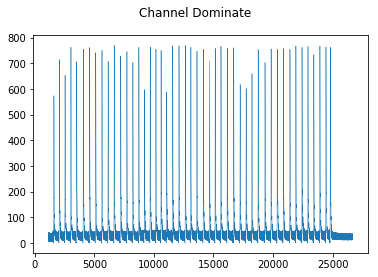

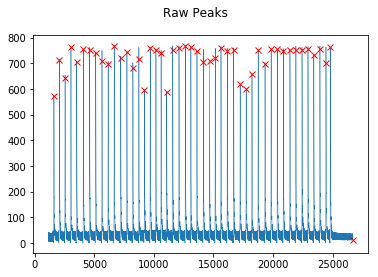

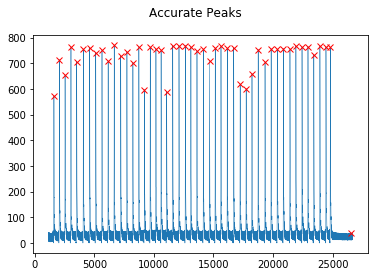

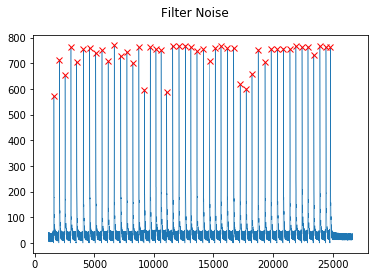

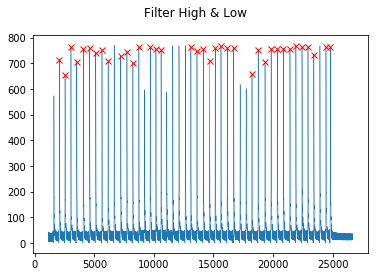

...

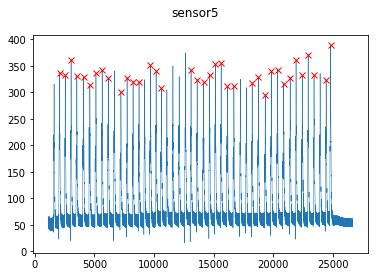

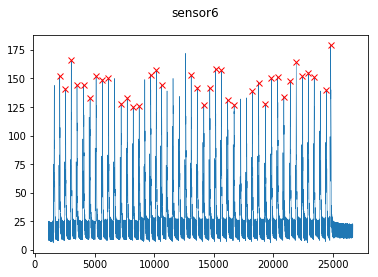

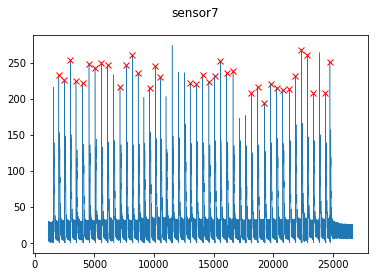

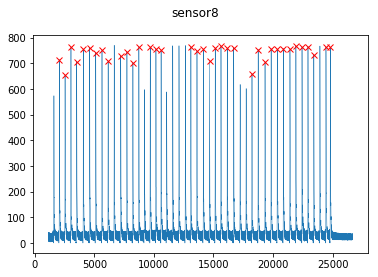

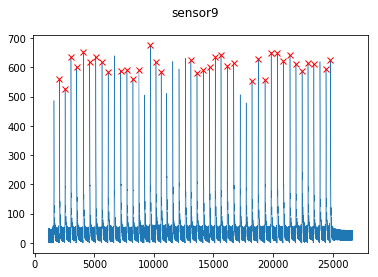

[[476.0, 400.0, 318.0, 430.0, 337.0, 152.0, 233.0, 715.0, 559.0], [432.0, 385.0, 319.0, 422.0, 332.0, 141.0, 226.0, 654.0, 528.0], [499.0, 388.0, 343.0, 454.0, 362.0, 166.0, 253.0, 763.0, 636.0], [476.0, 371.0, 324.0, 428.0, 331.0, 144.0, 224.0, 707.0, 601.0], [523.0, 411.0, 348.0, 447.0, 329.0, 144.0, 221.0, 756.0, 652.0], [482.0, 428.0, 361.0, 433.0, 314.0, 133.0, 248.0, 762.0, 618.0], [532.0, 428.0, 350.0, 425.0, 336.0, 152.0, 243.0, 742.0, 637.0], [479.0, 369.0, 329.0, 441.0, 342.0, 149.0, 250.0, 751.0, 618.0], [494.0, 405.0, 316.0, 419.0, 327.0, 150.0, 246.0, 708.0, 586.0], [477.0, 423.0, 352.0, 398.0, 301.0, 128.0, 216.0, 729.0, 588.0], [441.0, 397.0, 332.0, 435.0, 328.0, 133.0, 246.0, 746.0, 590.0], [423.0, 382.0, 323.0, 418.0, 320.0, 125.0, 260.0, 703.0, 561.0], [456.0, 407.0, 337.0, 425.0, 320.0, 126.0, 235.0, 763.0, 592.0], [544.0, 424.0, 383.0, 459.0, 351.0, 153.0, 215.0, 764.0, 676.0], [519.0, 421.0, 332.0, 446.0, 341.0, 157.0, 245.0, 756.0, 619.0], [506.0, 438.0, 352.0, 41

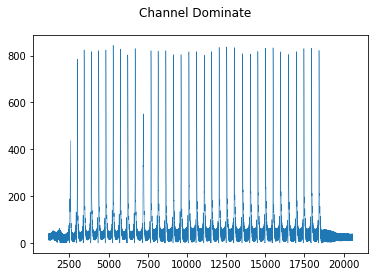

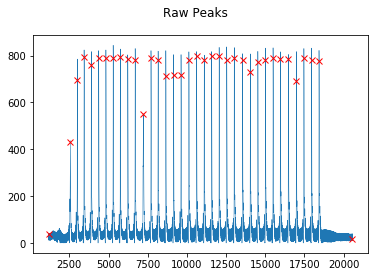

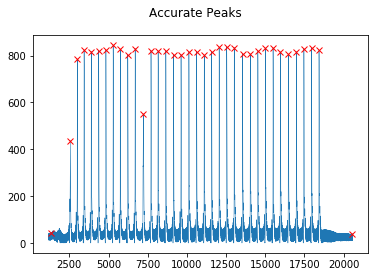

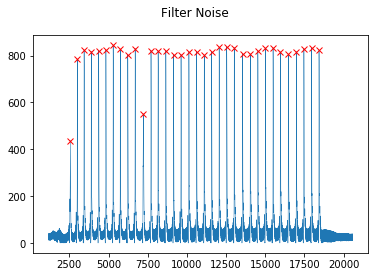

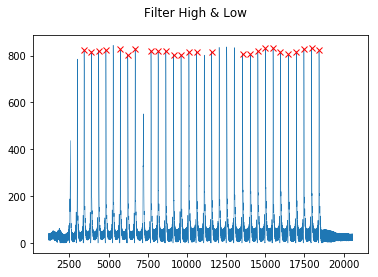

...

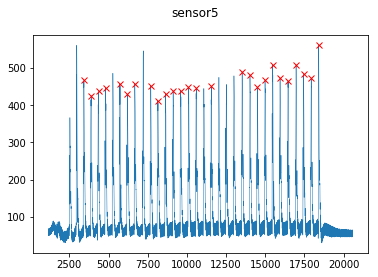

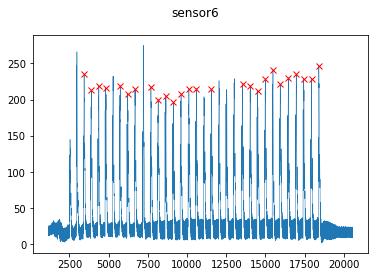

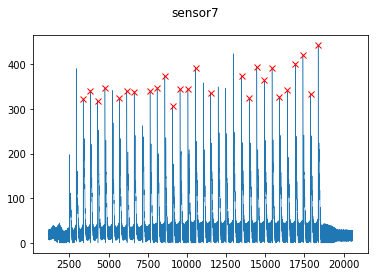

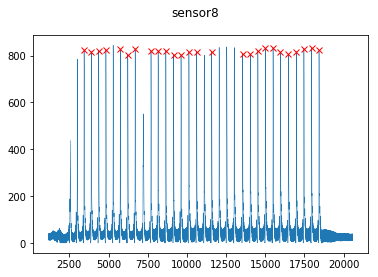

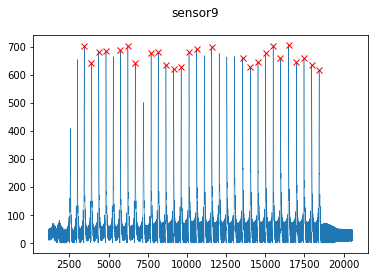

[[601.0, 484.0, 392.0, 511.0, 466.0, 235.0, 323.0, 824.0, 702.0], [562.0, 471.0, 372.0, 496.0, 425.0, 213.0, 341.0, 817.0, 643.0], [514.0, 424.0, 375.0, 527.0, 436.0, 219.0, 319.0, 821.0, 682.0], [513.0, 452.0, 393.0, 525.0, 446.0, 216.0, 348.0, 824.0, 685.0], [526.0, 414.0, 373.0, 484.0, 457.0, 219.0, 324.0, 828.0, 688.0], [583.0, 456.0, 397.0, 481.0, 428.0, 208.0, 340.0, 803.0, 701.0], [545.0, 472.0, 383.0, 483.0, 457.0, 214.0, 339.0, 830.0, 640.0], [543.0, 417.0, 384.0, 476.0, 452.0, 217.0, 341.0, 821.0, 677.0], [589.0, 479.0, 382.0, 454.0, 411.0, 200.0, 348.0, 819.0, 681.0], [466.0, 425.0, 362.0, 471.0, 430.0, 205.0, 374.0, 821.0, 634.0], [530.0, 420.0, 332.0, 439.0, 438.0, 196.0, 306.0, 804.0, 620.0], [548.0, 443.0, 342.0, 485.0, 438.0, 207.0, 345.0, 804.0, 629.0], [592.0, 475.0, 391.0, 474.0, 448.0, 214.0, 346.0, 816.0, 680.0], [514.0, 437.0, 392.0, 478.0, 445.0, 215.0, 393.0, 817.0, 690.0], [545.0, 434.0, 397.0, 485.0, 450.0, 214.0, 336.0, 817.0, 697.0], [592.0, 494.0, 388.0, 47

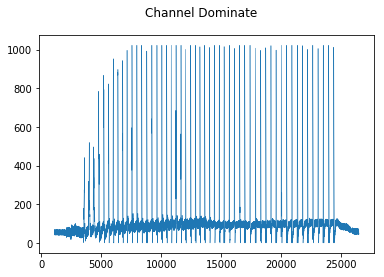

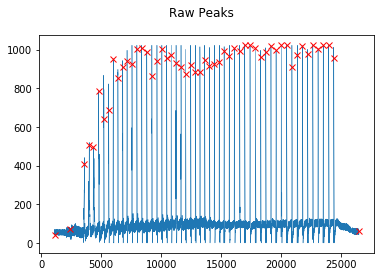

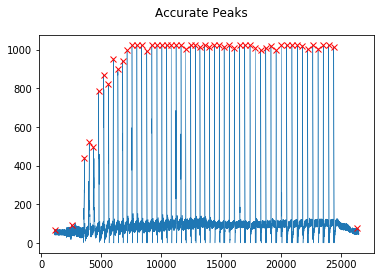

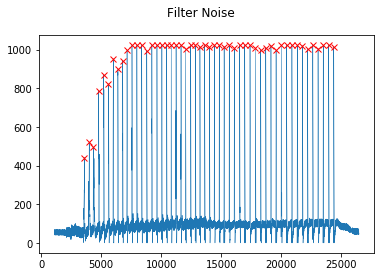

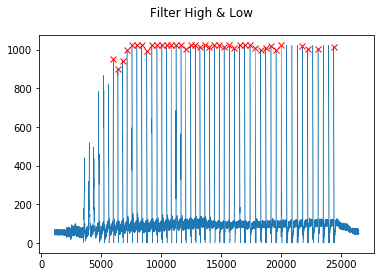

...

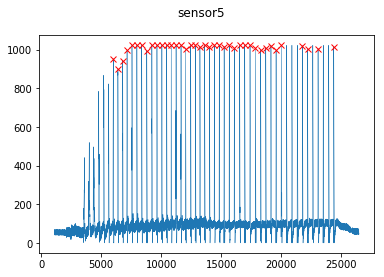

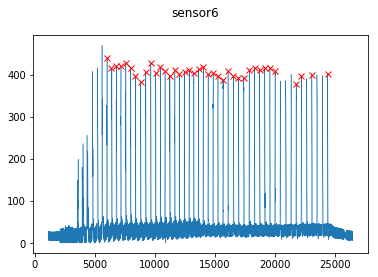

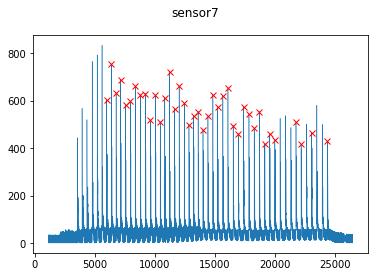

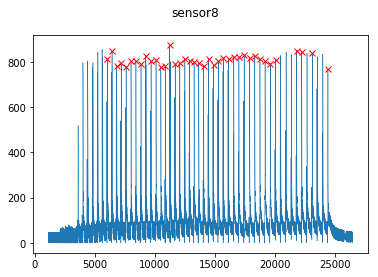

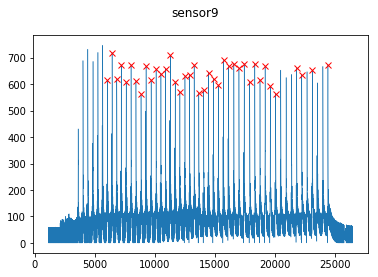

[[571.0, 679.0, 594.0, 905.0, 953.0, 440.0, 603.0, 815.0, 615.0], [518.0, 822.0, 697.0, 914.0, 898.0, 416.0, 753.0, 849.0, 719.0], [565.0, 741.0, 603.0, 907.0, 944.0, 421.0, 633.0, 783.0, 618.0], [489.0, 797.0, 697.0, 931.0, 997.0, 420.0, 689.0, 795.0, 673.0], [571.0, 698.0, 623.0, 934.0, 1023.0, 428.0, 581.0, 780.0, 608.0], [541.0, 692.0, 636.0, 937.0, 1023.0, 417.0, 598.0, 804.0, 673.0], [435.0, 768.0, 689.0, 941.0, 1023.0, 396.0, 661.0, 804.0, 611.0], [470.0, 777.0, 689.0, 945.0, 993.0, 382.0, 626.0, 791.0, 561.0], [496.0, 840.0, 829.0, 1002.0, 1023.0, 406.0, 630.0, 828.0, 668.0], [493.0, 776.0, 723.0, 966.0, 1023.0, 428.0, 518.0, 805.0, 616.0], [544.0, 759.0, 742.0, 973.0, 1023.0, 403.0, 623.0, 807.0, 656.0], [547.0, 758.0, 728.0, 969.0, 1023.0, 418.0, 511.0, 777.0, 640.0], [489.0, 765.0, 759.0, 979.0, 1023.0, 408.0, 612.0, 781.0, 658.0], [557.0, 850.0, 798.0, 993.0, 1023.0, 397.0, 723.0, 874.0, 709.0], [528.0, 812.0, 746.0, 975.0, 1023.0, 412.0, 567.0, 791.0, 609.0], [525.0, 776.0

In [10]:
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l8f1.txt"
l8f1 = dataProcess(file,500,80,20)
print(l8f1)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l8f2.txt"
l8f2 = dataProcess(file,500,80,20)
print(l8f2)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l8f3.txt"
l8f3 = dataProcess(file,500,80,20)
print(l8f3)

(9128, 10)
4


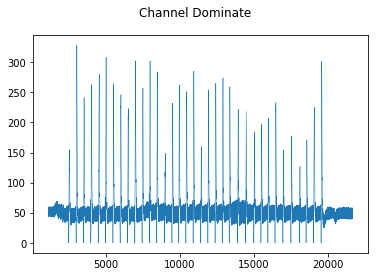

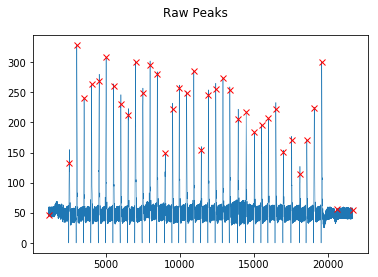

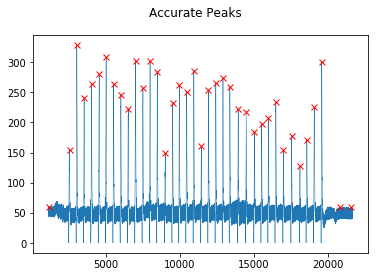

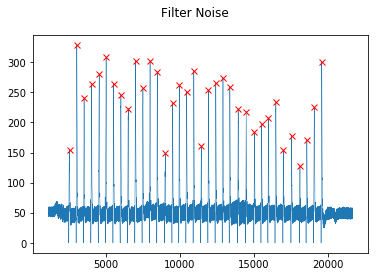

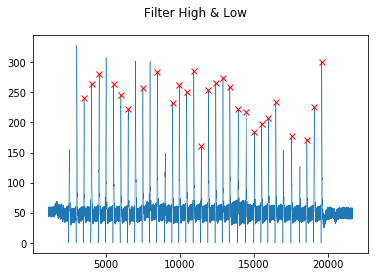

...

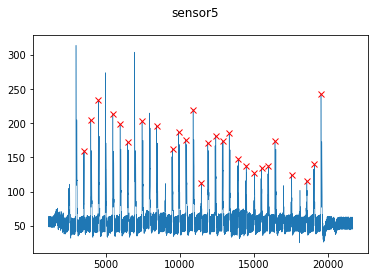

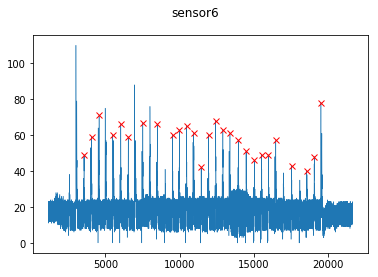

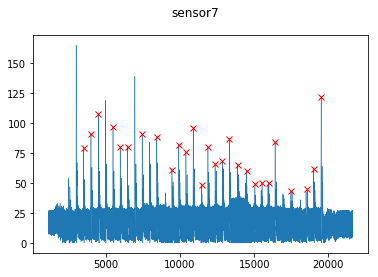

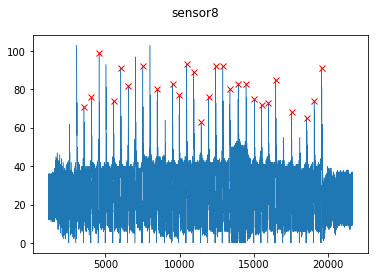

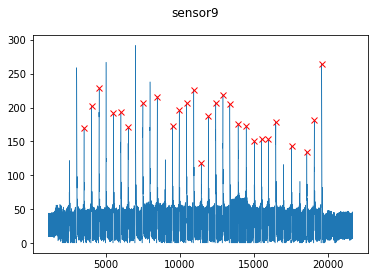

[[175.0, 135.0, 121.0, 241.0, 160.0, 49.0, 79.0, 71.0, 170.0], [202.0, 156.0, 146.0, 263.0, 205.0, 59.0, 91.0, 76.0, 202.0], [241.0, 202.0, 172.0, 280.0, 234.0, 71.0, 108.0, 99.0, 229.0], [198.0, 154.0, 144.0, 264.0, 214.0, 60.0, 97.0, 74.0, 192.0], [197.0, 163.0, 143.0, 246.0, 199.0, 66.0, 80.0, 91.0, 193.0], [178.0, 150.0, 134.0, 223.0, 172.0, 59.0, 80.0, 82.0, 171.0], [213.0, 180.0, 156.0, 257.0, 203.0, 67.0, 91.0, 92.0, 206.0], [214.0, 169.0, 158.0, 284.0, 196.0, 66.0, 88.0, 80.0, 216.0], [179.0, 156.0, 138.0, 232.0, 163.0, 60.0, 61.0, 83.0, 173.0], [196.0, 166.0, 154.0, 262.0, 187.0, 63.0, 82.0, 77.0, 196.0], [212.0, 170.0, 147.0, 251.0, 176.0, 65.0, 76.0, 93.0, 206.0], [235.0, 183.0, 153.0, 285.0, 220.0, 61.0, 96.0, 89.0, 226.0], [110.0, 103.0, 103.0, 160.0, 113.0, 42.0, 48.0, 63.0, 118.0], [187.0, 159.0, 149.0, 254.0, 171.0, 60.0, 80.0, 76.0, 187.0], [217.0, 180.0, 155.0, 265.0, 182.0, 68.0, 66.0, 92.0, 207.0], [223.0, 176.0, 149.0, 274.0, 174.0, 63.0, 68.0, 92.0, 219.0], [201.0

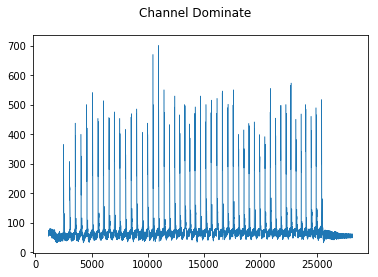

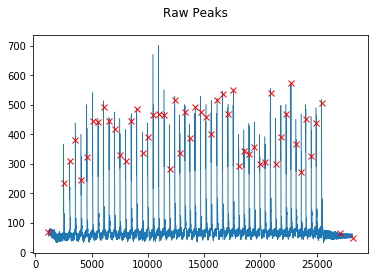

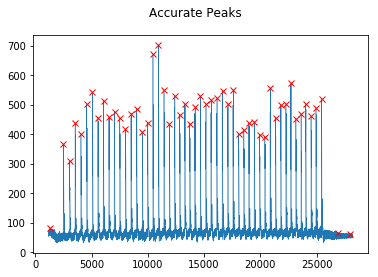

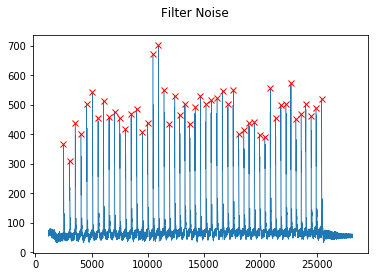

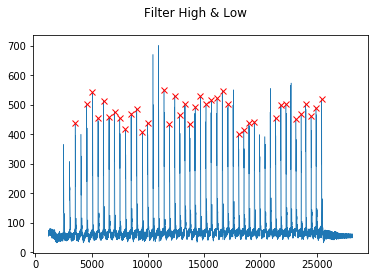

...

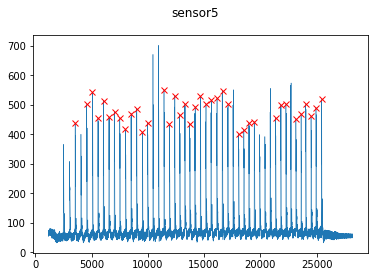

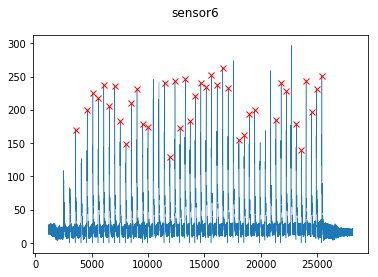

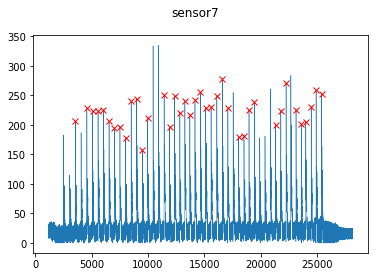

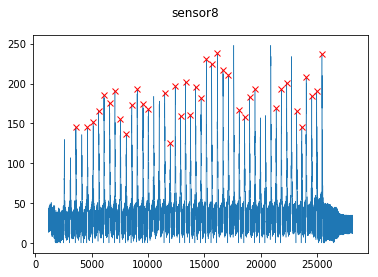

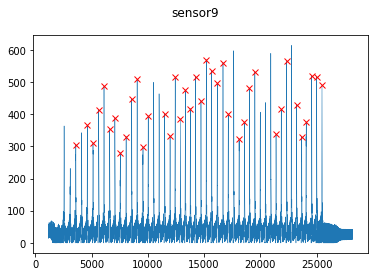

[[328.0, 279.0, 236.0, 348.0, 438.0, 170.0, 206.0, 145.0, 306.0], [357.0, 285.0, 264.0, 378.0, 501.0, 200.0, 228.0, 145.0, 366.0], [321.0, 284.0, 256.0, 394.0, 542.0, 225.0, 224.0, 152.0, 310.0], [416.0, 325.0, 307.0, 384.0, 454.0, 217.0, 223.0, 166.0, 414.0], [503.0, 407.0, 327.0, 416.0, 514.0, 237.0, 226.0, 185.0, 487.0], [388.0, 329.0, 278.0, 375.0, 457.0, 205.0, 206.0, 176.0, 353.0], [387.0, 324.0, 303.0, 417.0, 476.0, 236.0, 194.0, 191.0, 388.0], [293.0, 255.0, 227.0, 410.0, 454.0, 183.0, 197.0, 155.0, 281.0], [345.0, 275.0, 229.0, 311.0, 417.0, 149.0, 178.0, 137.0, 331.0], [475.0, 389.0, 319.0, 405.0, 470.0, 210.0, 240.0, 173.0, 448.0], [518.0, 407.0, 323.0, 378.0, 486.0, 232.0, 244.0, 193.0, 509.0], [316.0, 271.0, 236.0, 408.0, 407.0, 179.0, 157.0, 174.0, 298.0], [426.0, 352.0, 288.0, 348.0, 438.0, 174.0, 211.0, 168.0, 395.0], [417.0, 333.0, 285.0, 370.0, 551.0, 240.0, 251.0, 188.0, 401.0], [350.0, 277.0, 236.0, 282.0, 433.0, 129.0, 196.0, 125.0, 333.0], [534.0, 441.0, 365.0, 43

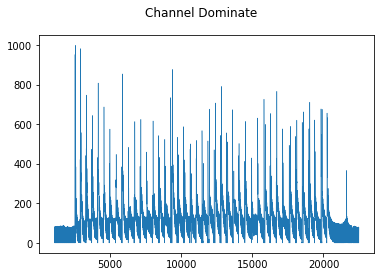

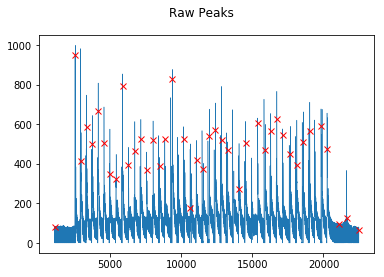

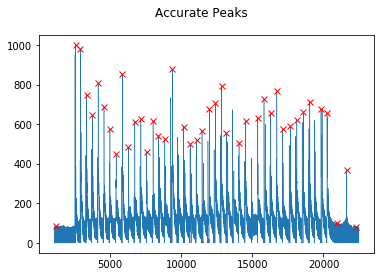

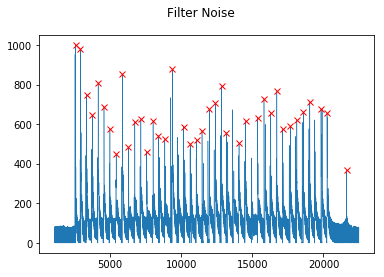

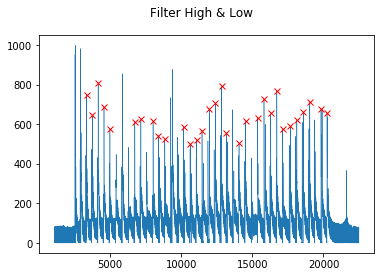

...

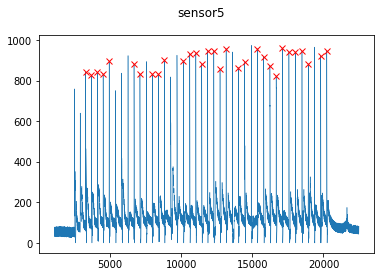

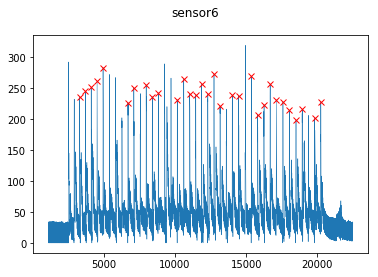

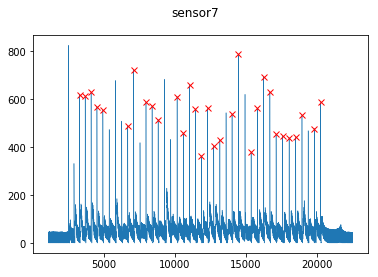

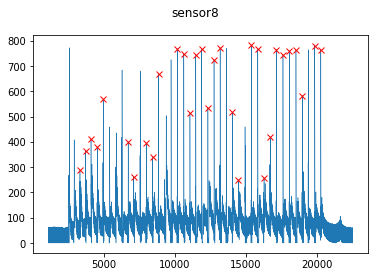

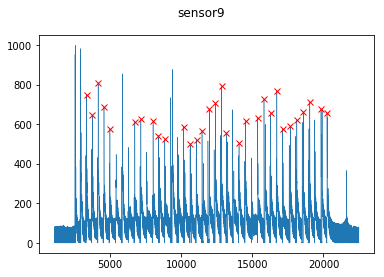

[[607.0, 861.0, 765.0, 641.0, 842.0, 235.0, 619.0, 287.0, 748.0], [547.0, 833.0, 764.0, 664.0, 827.0, 245.0, 612.0, 364.0, 645.0], [576.0, 834.0, 725.0, 642.0, 842.0, 251.0, 630.0, 411.0, 809.0], [573.0, 794.0, 712.0, 610.0, 832.0, 261.0, 569.0, 380.0, 688.0], [422.0, 773.0, 775.0, 719.0, 895.0, 283.0, 555.0, 569.0, 576.0], [539.0, 779.0, 716.0, 631.0, 881.0, 226.0, 488.0, 401.0, 614.0], [527.0, 813.0, 748.0, 680.0, 833.0, 250.0, 722.0, 262.0, 625.0], [512.0, 783.0, 686.0, 611.0, 832.0, 255.0, 588.0, 394.0, 617.0], [476.0, 868.0, 748.0, 656.0, 830.0, 236.0, 572.0, 338.0, 543.0], [365.0, 771.0, 796.0, 761.0, 902.0, 242.0, 515.0, 667.0, 524.0], [391.0, 781.0, 757.0, 692.0, 898.0, 231.0, 611.0, 768.0, 588.0], [445.0, 765.0, 730.0, 703.0, 930.0, 264.0, 458.0, 748.0, 501.0], [451.0, 778.0, 765.0, 696.0, 934.0, 240.0, 659.0, 514.0, 519.0], [420.0, 762.0, 718.0, 695.0, 880.0, 238.0, 560.0, 742.0, 568.0], [490.0, 782.0, 722.0, 675.0, 944.0, 256.0, 364.0, 766.0, 677.0], [531.0, 773.0, 778.0, 72

In [11]:
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l9f1.txt"
l9f1 = dataProcess(file,500,80,20)
print(l9f1)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l9f2.txt"
l9f2 = dataProcess(file,500,80,20)
print(l9f2)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\train1\\l9f3.txt"
l9f3 = dataProcess(file,500,80,20)
print(l9f3)

In [12]:
'''data for position estimation'''
def dataSplit(data,positionInd):
    np.random.shuffle(data)
    n = np.shape(data)[0]
    nVal = math.ceil(n*0.2)
    nTest = math.ceil(n*0.1)
    nTrain = n-nVal-nTest
    xVal = data[0:nVal]
    xTest = data[nVal:nVal+nTest]
    xTrain = data[nVal+nTest:]
    yVal = positionInd*np.ones(nVal)
    yVal = np_utils.to_categorical(yVal,9)
    yTest = positionInd*np.ones(nTest)
    yTest = np_utils.to_categorical(yTest,9)
    yTrain = positionInd*np.ones(nTrain)
    yTrain = np_utils.to_categorical(yTrain,9)
    return [xTrain,xVal,xTest,yTrain,yVal,yTest]

a11 = dataSplit(l1f1,0)
a21 = dataSplit(l2f1,1)
a31 = dataSplit(l3f1,2)
a41 = dataSplit(l4f1,3)
a51 = dataSplit(l5f1,4)
a61 = dataSplit(l6f1,5)
a71 = dataSplit(l7f1,6)
a81 = dataSplit(l8f1,7)
a91 = dataSplit(l9f1,8)


a12 = dataSplit(l1f2,0)
a13 = dataSplit(l1f3,0)
a22 = dataSplit(l2f2,1)
a23 = dataSplit(l2f3,1)
a32 = dataSplit(l3f2,2)
a33 = dataSplit(l3f3,2)
a42 = dataSplit(l4f2,3)
a43 = dataSplit(l4f3,3)
a52 = dataSplit(l5f2,4)
a53 = dataSplit(l5f3,4)
a62 = dataSplit(l6f2,5)
a63 = dataSplit(l6f3,5)
a72 = dataSplit(l7f2,6)
a73 = dataSplit(l7f3,6)
a82 = dataSplit(l8f2,7)
a83 = dataSplit(l8f3,7)
a92 = dataSplit(l9f2,8)
a93 = dataSplit(l9f3,8)


num = 0
x_train = np.concatenate((a11[num],a12[num],a13[num],a21[num],a22[num],a23[num],a31[num],a32[num],a33[num],
                        a41[num],a42[num],a43[num],a51[num],a52[num],a53[num],a61[num],a62[num],a63[num],
                        a71[num],a72[num],a73[num],a81[num],a82[num],a83[num],a91[num],a92[num],a93[num]),axis = 0)

num = 1
x_val = np.concatenate((a11[num],a12[num],a13[num],a21[num],a22[num],a23[num],a31[num],a32[num],a33[num],
                        a41[num],a42[num],a43[num],a51[num],a52[num],a53[num],a61[num],a62[num],a63[num],
                        a71[num],a72[num],a73[num],a81[num],a82[num],a83[num],a91[num],a92[num],a93[num]),axis = 0)

num = 2
x_test = np.concatenate((a11[num],a12[num],a13[num],a21[num],a22[num],a23[num],a31[num],a32[num],a33[num],
                        a41[num],a42[num],a43[num],a51[num],a52[num],a53[num],a61[num],a62[num],a63[num],
                        a71[num],a72[num],a73[num],a81[num],a82[num],a83[num],a91[num],a92[num],a93[num]),axis = 0)

num = 3
y_train = np.concatenate((a11[num],a12[num],a13[num],a21[num],a22[num],a23[num],a31[num],a32[num],a33[num],
                        a41[num],a42[num],a43[num],a51[num],a52[num],a53[num],a61[num],a62[num],a63[num],
                        a71[num],a72[num],a73[num],a81[num],a82[num],a83[num],a91[num],a92[num],a93[num]),axis = 0)

num = 4
y_val = np.concatenate((a11[num],a12[num],a13[num],a21[num],a22[num],a23[num],a31[num],a32[num],a33[num],
                        a41[num],a42[num],a43[num],a51[num],a52[num],a53[num],a61[num],a62[num],a63[num],
                        a71[num],a72[num],a73[num],a81[num],a82[num],a83[num],a91[num],a92[num],a93[num]),axis = 0)

num = 5
y_test = np.concatenate((a11[num],a12[num],a13[num],a21[num],a22[num],a23[num],a31[num],a32[num],a33[num],
                        a41[num],a42[num],a43[num],a51[num],a52[num],a53[num],a61[num],a62[num],a63[num],
                        a71[num],a72[num],a73[num],a81[num],a82[num],a83[num],a91[num],a92[num],a93[num]),axis = 0)

output = open('x_train_9_big', 'wb')
pickle.dump(x_train, output)
output.close()
output = open('x_val_9_big', 'wb')
pickle.dump(x_val, output)
output.close()
output = open('x_test_9_big', 'wb')
pickle.dump(x_test, output)
output.close()
output = open('y_train_9_big', 'wb')
pickle.dump(y_train, output)
output.close()
output = open('y_val_9_big', 'wb')
pickle.dump(y_val, output)
output.close()
output = open('y_test_9_big', 'wb')
pickle.dump(y_test, output)
output.close()



In [13]:
'''data for force estimation'''
def dataSplit(data,positionInd,forceLevel):
    np.random.shuffle(data)
    n = np.shape(data)[0]
    nVal = math.ceil(n*0.2)
    nTest = math.ceil(n*0.1)
    nTrain = n-nVal-nTest
    
    xVal0 = data[0:nVal]
    xTest0 = data[nVal:nVal+nTest]
    xTrain0 = data[nVal+nTest:]
    
    xVal1 = positionInd*np.ones(nVal)
    xVal1 = np_utils.to_categorical(xVal1,9)
    xTest1 = positionInd*np.ones(nTest)
    xTest1 = np_utils.to_categorical(xTest1,9)
    xTrain1 = positionInd*np.ones(nTrain)
    xTrain1 = np_utils.to_categorical(xTrain1,9)
    
    xVal = np.concatenate((xVal0,xVal1),axis = 1)
    xTest = np.concatenate((xTest0,xTest1),axis = 1)
    xTrain = np.concatenate((xTrain0,xTrain1),axis = 1)
    
    yVal = forceLevel*np.ones(nVal)
    yVal = np_utils.to_categorical(yVal,3)
    yTest = forceLevel*np.ones(nTest)
    yTest = np_utils.to_categorical(yTest,3)
    yTrain = forceLevel*np.ones(nTrain)
    yTrain = np_utils.to_categorical(yTrain,3)
    return [xTrain,xVal,xTest,yTrain,yVal,yTest]

a11 = dataSplit(l1f1,0,0)
a21 = dataSplit(l2f1,1,0)
a31 = dataSplit(l3f1,2,0)
a41 = dataSplit(l4f1,3,0)
a51 = dataSplit(l5f1,4,0)
a61 = dataSplit(l6f1,5,0)
a71 = dataSplit(l7f1,6,0)
a81 = dataSplit(l8f1,7,0)
a91 = dataSplit(l9f1,8,0)



a12 = dataSplit(l1f2,0,1)
a13 = dataSplit(l1f3,0,2)
a22 = dataSplit(l2f2,1,1)
a23 = dataSplit(l2f3,1,2)
a32 = dataSplit(l3f2,2,1)
a33 = dataSplit(l3f3,2,2)
a42 = dataSplit(l4f2,3,1)
a43 = dataSplit(l4f3,3,2)
a52 = dataSplit(l5f2,4,1)
a53 = dataSplit(l5f3,4,2)
a62 = dataSplit(l6f2,5,1)
a63 = dataSplit(l6f3,5,2)
a72 = dataSplit(l7f2,6,1)
a73 = dataSplit(l7f3,6,2)
a82 = dataSplit(l8f2,7,1)
a83 = dataSplit(l8f3,7,2)
a92 = dataSplit(l9f2,8,1)
a93 = dataSplit(l9f3,8,2)



num = 0
x_train_force = np.concatenate((a11[num],a12[num],a13[num],a21[num],a22[num],a23[num],a31[num],a32[num],a33[num],
                        a41[num],a42[num],a43[num],a51[num],a52[num],a53[num],a61[num],a62[num],a63[num],
                        a71[num],a72[num],a73[num],a81[num],a82[num],a83[num],a91[num],a92[num],a93[num]),axis = 0)

num = 1
x_val_force = np.concatenate((a11[num],a12[num],a13[num],a21[num],a22[num],a23[num],a31[num],a32[num],a33[num],
                        a41[num],a42[num],a43[num],a51[num],a52[num],a53[num],a61[num],a62[num],a63[num],
                        a71[num],a72[num],a73[num],a81[num],a82[num],a83[num],a91[num],a92[num],a93[num]),axis = 0)

num = 2
x_test_force = np.concatenate((a11[num],a12[num],a13[num],a21[num],a22[num],a23[num],a31[num],a32[num],a33[num],
                        a41[num],a42[num],a43[num],a51[num],a52[num],a53[num],a61[num],a62[num],a63[num],
                        a71[num],a72[num],a73[num],a81[num],a82[num],a83[num],a91[num],a92[num],a93[num]),axis = 0)
num = 3
y_train_force = np.concatenate((a11[num],a12[num],a13[num],a21[num],a22[num],a23[num],a31[num],a32[num],a33[num],
                        a41[num],a42[num],a43[num],a51[num],a52[num],a53[num],a61[num],a62[num],a63[num],
                        a71[num],a72[num],a73[num],a81[num],a82[num],a83[num],a91[num],a92[num],a93[num]),axis = 0)
num = 4
y_val_force = np.concatenate((a11[num],a12[num],a13[num],a21[num],a22[num],a23[num],a31[num],a32[num],a33[num],
                        a41[num],a42[num],a43[num],a51[num],a52[num],a53[num],a61[num],a62[num],a63[num],
                        a71[num],a72[num],a73[num],a81[num],a82[num],a83[num],a91[num],a92[num],a93[num]),axis = 0)

num = 5
y_test_force = np.concatenate((a11[num],a12[num],a13[num],a21[num],a22[num],a23[num],a31[num],a32[num],a33[num],
                        a41[num],a42[num],a43[num],a51[num],a52[num],a53[num],a61[num],a62[num],a63[num],
                        a71[num],a72[num],a73[num],a81[num],a82[num],a83[num],a91[num],a92[num],a93[num]),axis = 0)

output = open('x_train_force_9_big', 'wb')
pickle.dump(x_train_force, output)
output.close()
output = open('x_val_force_9_big', 'wb')
pickle.dump(x_val_force, output)
output.close()
output = open('x_test_force_9_big', 'wb')
pickle.dump(x_test_force, output)
output.close()
output = open('y_train_force_9_big', 'wb')
pickle.dump(y_train_force, output)
output.close()
output = open('y_val_force_9_big', 'wb')
pickle.dump(y_val_force, output)
output.close()
output = open('y_test_force_9_big', 'wb')
pickle.dump(y_test_force, output)
output.close()

In [14]:
pkl_file = open('x_train_9_big', 'rb')
x_train = pickle.load(pkl_file)
pkl_file.close()

pkl_file = open('x_val_9_big', 'rb')
x_val = pickle.load(pkl_file)
pkl_file.close()

pkl_file = open('x_test_9_big', 'rb')
x_test = pickle.load(pkl_file)
pkl_file.close()

pkl_file = open('y_train_9_big', 'rb')
y_train = pickle.load(pkl_file)
pkl_file.close()

pkl_file = open('y_val_9_big', 'rb')
y_val = pickle.load(pkl_file)
pkl_file.close()

pkl_file = open('y_test_9_big', 'rb')
y_test = pickle.load(pkl_file)
pkl_file.close()



In [15]:
pkl_file = open('x_train_force_9_big', 'rb')
x_train_force = pickle.load(pkl_file)
pkl_file.close()

pkl_file = open('x_val_force_9_big', 'rb')
x_val_force = pickle.load(pkl_file)
pkl_file.close()

pkl_file = open('x_test_force_9_big', 'rb')
x_test_force = pickle.load(pkl_file)
pkl_file.close()

pkl_file = open('y_train_force_9_big', 'rb')
y_train_force = pickle.load(pkl_file)
pkl_file.close()

pkl_file = open('y_val_force_9_big', 'rb')
y_val_force = pickle.load(pkl_file)
pkl_file.close()

pkl_file = open('y_test_force_9_big', 'rb')
y_test_force = pickle.load(pkl_file)
pkl_file.close()

In [16]:
def DefineModel1():


    first_layer_width = 8192
    second_layer_width = 4096
    third_layer_width = 2048
    activation_func = 'relu' 
    loss_function = 'categorical_crossentropy'  
    dropout_rate = 0
    weight_regularizer = None
    learning_rate = 0.01
    
    ## Initialize model.
    model = Sequential()

    model.add(Dense(first_layer_width, input_dim=9, W_regularizer=weight_regularizer))
    model.add(Activation(activation_func))
    if dropout_rate > 0:
        model.add(Dropout(0.5))

    ## Second hidden layer.
    if second_layer_width > 0:
        model.add(Dense(second_layer_width))
        model.add(Activation(activation_func))
        if dropout_rate > 0:
            model.add(Dropout(0.5))   
    ## Third hidden layer        
    if third_layer_width > 0:
        model.add(Dense(third_layer_width))
        model.add(Activation(activation_func))
        if dropout_rate > 0:
            model.add(Dropout(0.5))
    
    ## Last layer has the same dimension as the number of classes
    model.add(Dense(9))
    ## For classification, the activation is softmax
    model.add(Activation('softmax'))
    ## Define optimizer. In this tutorial/codelab, we select SGD.
    ## You can also use other methods, e.g., opt = RMSprop()
    
    optmzr = keras.optimizers.Adam(lr=0.00001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
    model.compile(loss='categorical_crossentropy', optimizer=optmzr, metrics=["accuracy"])

    
    '''

    
    opt = SGD(lr=learning_rate, clipnorm=5.)
    ## Define loss function = 'categorical_crossentropy' or 'mean_squared_error'
    model.compile(loss=loss_function, optimizer=opt, metrics=["accuracy"])
   '''
    return model

In [17]:
def TrainModel1(data=None, epochs=100):

    start_time = time.time()
    model = DefineModel1()
    if data is None:
        print("Must provide data.")
        return
    x_train,x_val,y_train,y_val = data
    print('Start training.')
    
    history = model.fit(x_train, y_train,verbose=1,shuffle=True,nb_epoch=epochs,
                        validation_data=(x_val, y_val))
    print("Training took {0} seconds.".format(time.time() - start_time))
    return model, history

In [26]:
trained_model1, training_history1 = TrainModel1(data=[x_train,x_val,y_train,y_val])

C:\Users\PangTouXian\Anaconda3\envs\newTensorflowGpu\lib\site-packages\ipykernel_launcher.py:16: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8192, kernel_regularizer=None, input_dim=9)`
  app.launch_new_instance()
C:\Users\PangTouXian\Anaconda3\envs\newTensorflowGpu\lib\site-packages\keras\models.py:944: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.
  warnings.warn('The `nb_epoch` argument in `fit` '


Start training.
Train on 600 samples, validate on 194 samples
Epoch 1/100
600/600 [==============================] - 3s 4ms/step - loss: 6.2517 - acc: 0.3983 - val_loss: 2.8374 - val_acc: 0.6856
Epoch 2/100
600/600 [==============================] - 2s 3ms/step - loss: 2.3107 - acc: 0.7600 - val_loss: 2.1467 - val_acc: 0.8299
Epoch 3/100
600/600 [==============================] - 2s 3ms/step - loss: 2.1111 - acc: 0.8283 - val_loss: 1.9985 - val_acc: 0.8557
Epoch 4/100
600/600 [==============================] - 2s 3ms/step - loss: 2.0480 - acc: 0.8450 - val_loss: 1.9762 - val_acc: 0.8557
Epoch 5/100
600/600 [==============================] - 2s 3ms/step - loss: 1.9768 - acc: 0.8617 - val_loss: 1.9697 - val_acc: 0.8660
Epoch 6/100
600/600 [==============================] - 2s 3ms/step - loss: 1.9242 - acc: 0.8700 - val_loss: 2.0459 - val_acc: 0.8454
Epoch 7/100
600/600 [==============================] - 2s 3ms/step - loss: 1.9900 - acc: 0.8467 - val_loss: 2.2104 - val_acc: 0.7887
Epoch 8

Epoch 62/100
600/600 [==============================] - 2s 3ms/step - loss: 1.8658 - acc: 0.8817 - val_loss: 2.0068 - val_acc: 0.8711
Epoch 63/100
600/600 [==============================] - 2s 3ms/step - loss: 1.9364 - acc: 0.8683 - val_loss: 2.0088 - val_acc: 0.8711
Epoch 64/100
600/600 [==============================] - 2s 3ms/step - loss: 1.8913 - acc: 0.8750 - val_loss: 2.0093 - val_acc: 0.8711
Epoch 65/100
600/600 [==============================] - 2s 3ms/step - loss: 1.9138 - acc: 0.8733 - val_loss: 1.9914 - val_acc: 0.8711
Epoch 66/100
600/600 [==============================] - 2s 3ms/step - loss: 1.9690 - acc: 0.8700 - val_loss: 1.9329 - val_acc: 0.8608
Epoch 67/100
600/600 [==============================] - 2s 3ms/step - loss: 1.9056 - acc: 0.8683 - val_loss: 2.0019 - val_acc: 0.8711
Epoch 68/100
600/600 [==============================] - 2s 3ms/step - loss: 2.0731 - acc: 0.8550 - val_loss: 2.1543 - val_acc: 0.8402
Epoch 69/100
600/600 [==============================] - 2s 3ms

In [19]:
def PlotHistory(train_value, test_value, value_is_loss_or_acc,file):
    f, ax = plt.subplots()
    ax.plot([None] + train_value, '-')
    ax.plot([None] + test_value, '-')
    ## Plot legend and use the best location automatically: loc = 0.
    ax.legend(['Train ' + value_is_loss_or_acc, 'Validation ' + value_is_loss_or_acc], loc = 0) 
    ax.set_title('Training/Validation ' + value_is_loss_or_acc + ' per Epoch')
    ax.set_xlabel('Epoch')
    ax.set_ylabel(value_is_loss_or_acc)  
    plt.savefig(file)
 

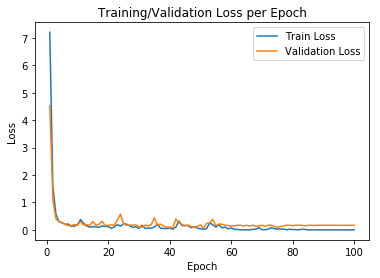

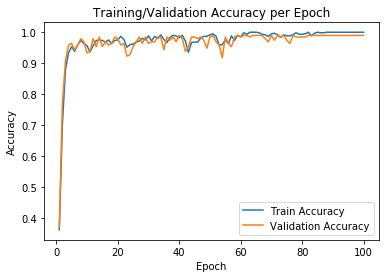

In [20]:
file1 = "C:\\Users\\PangTouXian\\Desktop\\gao project\\figure\\01.png"
file2 = "C:\\Users\\PangTouXian\\Desktop\\gao project\\figure\\02.png"

PlotHistory(training_history1.history['loss'], training_history1.history['val_loss'], 'Loss',file1)

PlotHistory(training_history1.history['acc'], training_history1.history['val_acc'], 'Accuracy',file2)



In [21]:
def DefineModel2():


    first_layer_width = 4096
    second_layer_width = 2048  
    third_layer_width = 1024
    activation_func = 'relu' 
    
    loss_function = 'categorical_crossentropy'
  
    dropout_rate = 1

    weight_regularizer = None

    learning_rate = 0.01
    
    ## Initialize model.
    model = Sequential()

    model.add(Dense(first_layer_width, input_dim=18, W_regularizer=weight_regularizer))
    model.add(Activation(activation_func))
    if dropout_rate > 0:
        model.add(Dropout(0.5))

    ## Second hidden layer.
    if second_layer_width > 0:
        model.add(Dense(second_layer_width))
        model.add(Activation(activation_func))
        if dropout_rate > 0:
            model.add(Dropout(0.5))         
    
    ## Third hidden layer.
    if third_layer_width > 0:
        model.add(Dense(third_layer_width))
        model.add(Activation(activation_func))
        if dropout_rate > 0:
            model.add(Dropout(0.25)) 
    ## Last layer has the same dimension as the number of classes
    model.add(Dense(3))
    ## For classification, the activation is softmax
    model.add(Activation('softmax'))

    optmzr = keras.optimizers.Adam(lr=0.00001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
    model.compile(loss='categorical_crossentropy', optimizer=optmzr, metrics=["accuracy"])
    
    '''    opt = SGD(lr=learning_rate, clipnorm=5.)
    ## Define loss function = 'categorical_crossentropy' or 'mean_squared_error'
    model.compile(loss=loss_function, optimizer=opt, metrics=["accuracy"])'''


    return model

In [22]:
def TrainModel2(data=None, epochs=400):   
    start_time = time.time()
    model = DefineModel2()
    if data is None:
        print("Must provide data.")
        return
    x_train,x_val,y_train,y_val = data
    print('Start training.')

    history = model.fit(x_train, y_train,verbose=1,shuffle=True,nb_epoch=epochs,validation_data=(x_val, y_val))
    print("Training took {0} seconds.".format(time.time() - start_time))
    return model, history

In [23]:
trained_model2, training_history2 = TrainModel2(data=[x_train_force,x_val_force,y_train_force,y_val_force])

C:\Users\PangTouXian\Anaconda3\envs\newTensorflowGpu\lib\site-packages\ipykernel_launcher.py:23: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(4096, kernel_regularizer=None, input_dim=18)`


Start training.
Train on 600 samples, validate on 194 samples
Epoch 1/400
600/600 [==============================] - 1s 2ms/step - loss: 9.3957 - acc: 0.3150 - val_loss: 8.0886 - val_acc: 0.3144
Epoch 2/400
600/600 [==============================] - 0s 806us/step - loss: 9.4043 - acc: 0.3183 - val_loss: 8.0480 - val_acc: 0.3144
Epoch 3/400
600/600 [==============================] - 0s 826us/step - loss: 8.9532 - acc: 0.3433 - val_loss: 7.5789 - val_acc: 0.3144
Epoch 4/400
600/600 [==============================] - 1s 894us/step - loss: 8.9567 - acc: 0.3383 - val_loss: 3.9292 - val_acc: 0.4897
Epoch 5/400
600/600 [==============================] - 0s 807us/step - loss: 8.7394 - acc: 0.3533 - val_loss: 5.1339 - val_acc: 0.5309
Epoch 6/400
600/600 [==============================] - 1s 880us/step - loss: 8.4957 - acc: 0.3900 - val_loss: 6.3837 - val_acc: 0.4227
Epoch 7/400
600/600 [==============================] - 0s 827us/step - loss: 7.9760 - acc: 0.4100 - val_loss: 6.9220 - val_acc: 0.

Epoch 61/400
600/600 [==============================] - 0s 804us/step - loss: 5.7188 - acc: 0.5567 - val_loss: 4.7145 - val_acc: 0.6082
Epoch 62/400
600/600 [==============================] - 0s 832us/step - loss: 5.7788 - acc: 0.5583 - val_loss: 4.0731 - val_acc: 0.6649
Epoch 63/400
600/600 [==============================] - 0s 831us/step - loss: 5.9895 - acc: 0.5367 - val_loss: 3.7947 - val_acc: 0.6804
Epoch 64/400
600/600 [==============================] - 0s 822us/step - loss: 5.6097 - acc: 0.5517 - val_loss: 4.4946 - val_acc: 0.6186
Epoch 65/400
600/600 [==============================] - 0s 813us/step - loss: 5.2574 - acc: 0.5833 - val_loss: 4.0249 - val_acc: 0.6495
Epoch 66/400
600/600 [==============================] - 0s 811us/step - loss: 5.4806 - acc: 0.5617 - val_loss: 3.7694 - val_acc: 0.7062
Epoch 67/400
600/600 [==============================] - 0s 815us/step - loss: 5.9691 - acc: 0.5533 - val_loss: 3.8071 - val_acc: 0.6701
Epoch 68/400
600/600 [==========================

600/600 [==============================] - 0s 822us/step - loss: 4.6937 - acc: 0.6067 - val_loss: 3.4533 - val_acc: 0.7062
Epoch 122/400
600/600 [==============================] - 0s 788us/step - loss: 4.6848 - acc: 0.6083 - val_loss: 3.3607 - val_acc: 0.7165
Epoch 123/400
600/600 [==============================] - 0s 787us/step - loss: 4.4672 - acc: 0.6250 - val_loss: 3.2640 - val_acc: 0.7423
Epoch 124/400
600/600 [==============================] - 0s 804us/step - loss: 4.7866 - acc: 0.6100 - val_loss: 3.3485 - val_acc: 0.7216
Epoch 125/400
600/600 [==============================] - 1s 836us/step - loss: 4.6783 - acc: 0.6367 - val_loss: 3.1687 - val_acc: 0.7216
Epoch 126/400
600/600 [==============================] - 1s 837us/step - loss: 4.5350 - acc: 0.6300 - val_loss: 3.3413 - val_acc: 0.7216
Epoch 127/400
600/600 [==============================] - 1s 857us/step - loss: 5.0554 - acc: 0.5950 - val_loss: 3.5014 - val_acc: 0.7216
Epoch 128/400
600/600 [==============================] 

Epoch 181/400
600/600 [==============================] - 0s 829us/step - loss: 3.9478 - acc: 0.6400 - val_loss: 2.2156 - val_acc: 0.7784
Epoch 182/400
600/600 [==============================] - 1s 859us/step - loss: 3.9683 - acc: 0.6333 - val_loss: 2.2066 - val_acc: 0.7784
Epoch 183/400
600/600 [==============================] - 1s 923us/step - loss: 3.7237 - acc: 0.6700 - val_loss: 2.2947 - val_acc: 0.7732
Epoch 184/400
600/600 [==============================] - 1s 881us/step - loss: 4.0377 - acc: 0.6550 - val_loss: 2.0932 - val_acc: 0.7887
Epoch 185/400
600/600 [==============================] - 0s 797us/step - loss: 3.4646 - acc: 0.6883 - val_loss: 2.0309 - val_acc: 0.7835
Epoch 186/400
600/600 [==============================] - 1s 889us/step - loss: 3.8518 - acc: 0.6300 - val_loss: 2.2968 - val_acc: 0.7732
Epoch 187/400
600/600 [==============================] - 0s 833us/step - loss: 3.8020 - acc: 0.6733 - val_loss: 1.9145 - val_acc: 0.7784
Epoch 188/400
600/600 [==================

Epoch 241/400
600/600 [==============================] - 1s 855us/step - loss: 2.9279 - acc: 0.6967 - val_loss: 1.4205 - val_acc: 0.8351
Epoch 242/400
600/600 [==============================] - 0s 815us/step - loss: 3.0250 - acc: 0.7067 - val_loss: 1.1617 - val_acc: 0.8402
Epoch 243/400
600/600 [==============================] - 0s 817us/step - loss: 2.9973 - acc: 0.6883 - val_loss: 1.1821 - val_acc: 0.8454
Epoch 244/400
600/600 [==============================] - 0s 800us/step - loss: 3.0818 - acc: 0.7033 - val_loss: 1.1940 - val_acc: 0.8351
Epoch 245/400
600/600 [==============================] - 1s 855us/step - loss: 2.8146 - acc: 0.7267 - val_loss: 1.3188 - val_acc: 0.8299
Epoch 246/400
600/600 [==============================] - 0s 831us/step - loss: 3.2205 - acc: 0.6933 - val_loss: 1.1899 - val_acc: 0.8247
Epoch 247/400
600/600 [==============================] - 1s 852us/step - loss: 2.9705 - acc: 0.6933 - val_loss: 1.1677 - val_acc: 0.8505
Epoch 248/400
600/600 [==================

Epoch 301/400
600/600 [==============================] - 0s 817us/step - loss: 2.7753 - acc: 0.6967 - val_loss: 0.7517 - val_acc: 0.8351
Epoch 302/400
600/600 [==============================] - 0s 794us/step - loss: 2.4691 - acc: 0.7250 - val_loss: 0.6984 - val_acc: 0.8454
Epoch 303/400
600/600 [==============================] - 0s 815us/step - loss: 2.7480 - acc: 0.7117 - val_loss: 0.6464 - val_acc: 0.8351
Epoch 304/400
600/600 [==============================] - 0s 810us/step - loss: 2.2817 - acc: 0.7383 - val_loss: 0.6592 - val_acc: 0.8505
Epoch 305/400
600/600 [==============================] - 0s 794us/step - loss: 2.6162 - acc: 0.7017 - val_loss: 0.5732 - val_acc: 0.8505
Epoch 306/400
600/600 [==============================] - 0s 831us/step - loss: 2.6418 - acc: 0.7200 - val_loss: 0.6258 - val_acc: 0.8196
Epoch 307/400
600/600 [==============================] - 0s 816us/step - loss: 2.6339 - acc: 0.7183 - val_loss: 0.8146 - val_acc: 0.8454
Epoch 308/400
600/600 [==================

Epoch 361/400
600/600 [==============================] - 0s 789us/step - loss: 2.1952 - acc: 0.7350 - val_loss: 0.5064 - val_acc: 0.8711
Epoch 362/400
600/600 [==============================] - 0s 797us/step - loss: 2.0961 - acc: 0.7383 - val_loss: 0.4966 - val_acc: 0.8660
Epoch 363/400
600/600 [==============================] - 0s 807us/step - loss: 2.3188 - acc: 0.7650 - val_loss: 0.5293 - val_acc: 0.8608
Epoch 364/400
600/600 [==============================] - 0s 787us/step - loss: 2.1161 - acc: 0.7583 - val_loss: 0.4996 - val_acc: 0.8505
Epoch 365/400
600/600 [==============================] - 0s 807us/step - loss: 1.8114 - acc: 0.7867 - val_loss: 0.5663 - val_acc: 0.8711
Epoch 366/400
600/600 [==============================] - 0s 792us/step - loss: 2.3166 - acc: 0.7383 - val_loss: 0.5754 - val_acc: 0.8505
Epoch 367/400
600/600 [==============================] - 0s 772us/step - loss: 1.7892 - acc: 0.7750 - val_loss: 0.4952 - val_acc: 0.8763
Epoch 368/400
600/600 [==================

C:\Users\PangTouXian\Anaconda3\envs\newTensorflowGpu\lib\site-packages\keras\models.py:944: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.
  warnings.warn('The `nb_epoch` argument in `fit` '


In [24]:
def PlotHistory1(train_value, test_value, value_is_loss_or_acc):
    f, ax = plt.subplots()
    ax.plot([None] + test_value, '-')
    ax.plot([None] + train_value, '-')
    ## Plot legend and use the best location automatically: loc = 0.
    ax.legend(['Train ' + value_is_loss_or_acc, 'Validation ' + value_is_loss_or_acc], loc = 0) 
    ax.set_title('Training/Validation ' + value_is_loss_or_acc + ' per Epoch')
    ax.set_xlabel('Epoch')
    ax.set_ylabel(value_is_loss_or_acc)  


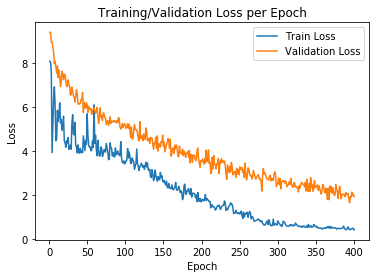

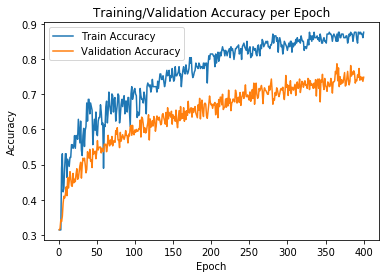

In [25]:
PlotHistory1(training_history2.history['loss'], training_history2.history['val_loss'], 'Loss')
PlotHistory1(training_history2.history['acc'], training_history2.history['val_acc'], 'Accuracy')

In [43]:
def TestModel(model=None, data=None):
    if model is None:
        print("Must provide a trained model.")
        return
    if data is None:
        print("Must provide data.")
        return
    x_test, y_test = data
    scores = model.evaluate(x_test, y_test)
    return scores

In [44]:
test_score = TestModel(model=trained_model1, data=[x_test, y_test])
print("Test loss {:.4f}, accuracy {:.2f}%".format(test_score[0], test_score[1] * 100))

print(y_test)


 32/104 [========>.....................] - ETA: 0sTest loss 0.5238, accuracy 96.15%
[[ 1.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  1.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  1.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  1.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  1.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  1.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  1.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  1.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  1.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  1.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  1.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  1.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  1.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  1.  0.  

In [74]:
def TestModel01(model=None, data=None):
    if model is None:
        print("Must provide a trained model.")
        return
    if data is None:
        print("Must provide data.")
        return
    a,b = np.shape(data)
    for i in range (0,a):
        scores =model.predict_on_batch(np.reshape(data[i,:],[1,9]))
        print(np.argmax(scores)+1)

In [75]:
TestModel01(model=trained_model1, data=x_test)

1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
5
2
2
2
3
3
3
5
3
5
3
3
3
3
3
5
4
4
4
4
4
4
4
4
4
4
4
5
5
5
5
5
5
5
5
5
5
5
5
6
6
6
6
6
6
6
6
6
6
6
6
6
6
7
7
7
7
7
7
7
7
7
7
7
7
8
8
8
8
8
8
8
8
8
8
8
9
9
9
9
9
9
9
9
9
9
9


In [79]:
def TestModel02(model=None, data=None):
    if model is None:
        print("Must provide a trained model.")
        return
    if data is None:
        print("Must provide data.")
        return
    a,b = np.shape(data)
    for i in range (0,a):
        scores =model.predict_on_batch(np.reshape(data[i,:],[1,18]))
        print(np.argmax(scores)+1)

In [80]:
test_score = TestModel(model=trained_model2, data=[x_test_force, y_test_force])
print("Test loss {:.4f}, accuracy {:.2f}%".format(test_score[0], test_score[1] * 100))
print(y_test_force)

 32/104 [========>.....................] - ETA: 0sTest loss 0.2913, accuracy 88.46%
[[ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 0.  0.  1.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 1.  0.  0.]
 [ 0.  1.  0.]
 

In [77]:
print(np.shape(x_test_force))

(104, 18)


In [81]:
TestModel02(model=trained_model2, data=x_test_force)

1
1
1
2
2
2
2
3
3
3
3
1
2
1
2
2
2
3
3
3
3
1
1
1
3
3
2
2
1
3
3
3
1
1
1
2
2
3
2
3
3
3
3
3
3
1
1
1
2
2
2
3
3
3
3
3
1
1
2
1
2
2
2
2
3
3
3
3
3
3
1
1
2
2
2
2
2
2
3
3
3
3
1
1
1
1
2
1
2
3
3
3
3
1
1
1
2
1
2
1
3
3
3
3


In [42]:
def TestModel1(model=None, data=None):
    if model is None:
        print("Must provide a trained model.")
        return
    if data is None:
        print("Must provide data.")
        return
    
    scores =model.predict_on_batch(np.reshape(data,[1,9]))
    
    position = sorted(enumerate(scores[0]), key=lambda x:x[1])
    
    return position

def TestModel2(model1=None, model2=None,data=None):
    if model1 is None:
        print("Must provide a trained model.")
        return
    if model2 is None:
        print("Must provide a trained model.")
        return
    if data is None:
        print("Must provide data.")
        return
    
    scores1 =model1.predict_on_batch(np.reshape(data,[1,9]))
    data = np.reshape(data,[1,9])
    data = np.concatenate((data,scores1),axis=1)
    data = np.reshape(data,[1,18])
    scores2 =model2.predict_on_batch(data)
    force = sorted(enumerate(scores2[0]), key=lambda x:x[1])
    
    return force

(6014, 10)
5


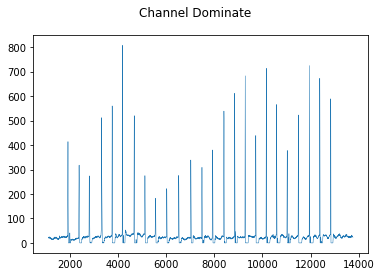

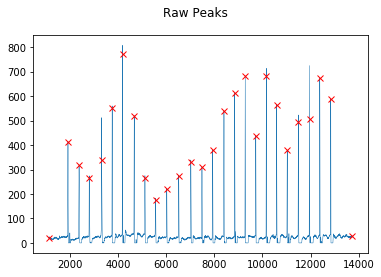

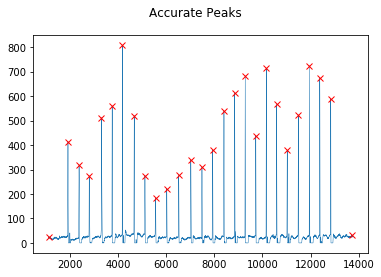

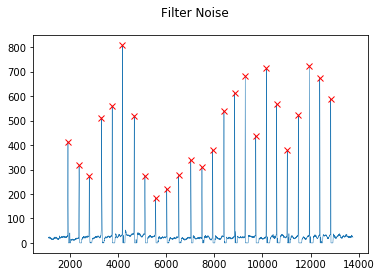

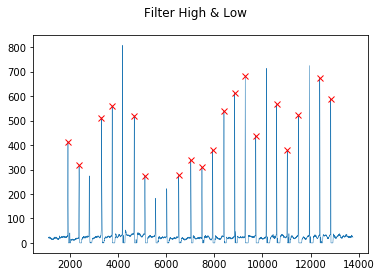

...

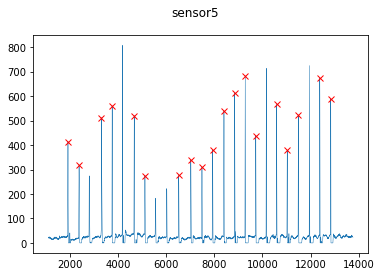

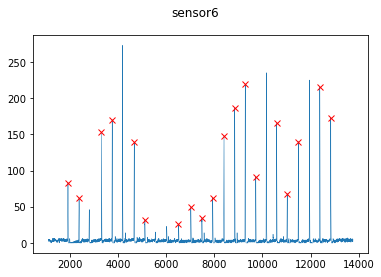

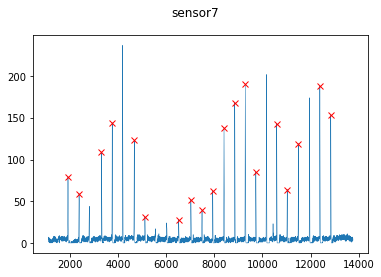

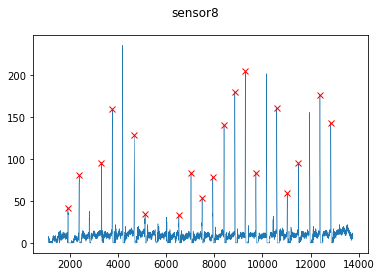

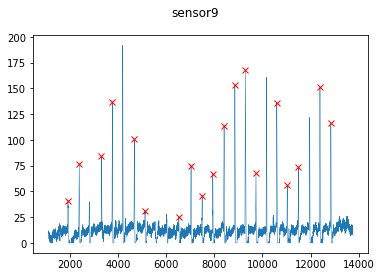

(10637, 10)
5


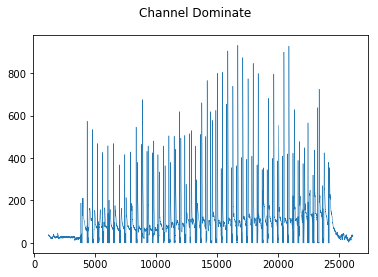

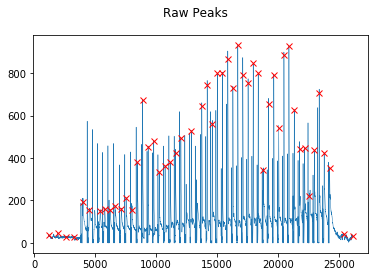

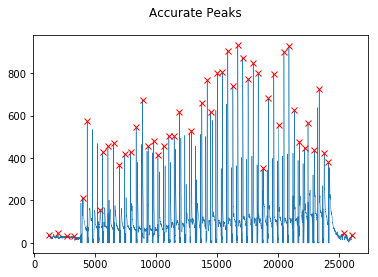

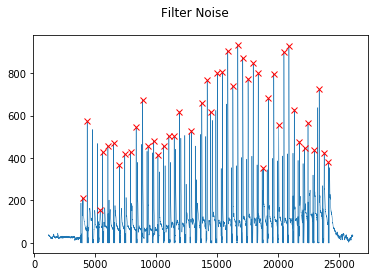

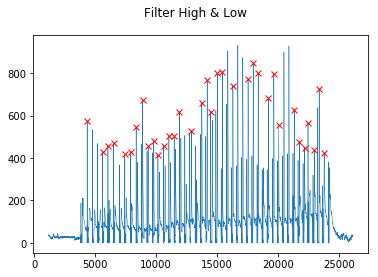

...

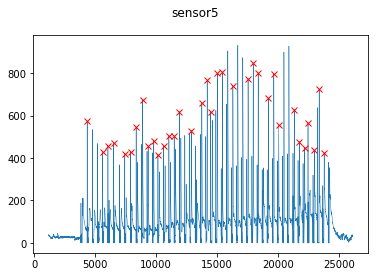

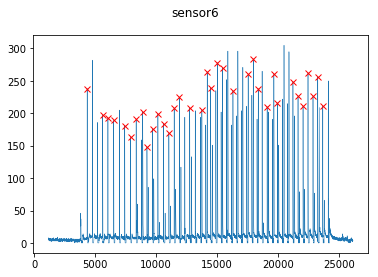

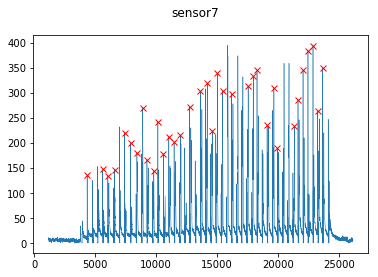

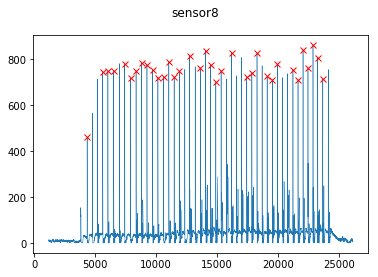

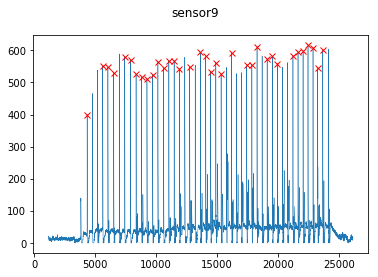

(10625, 10)
5


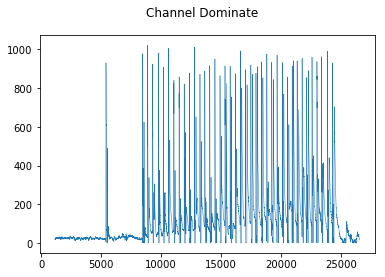

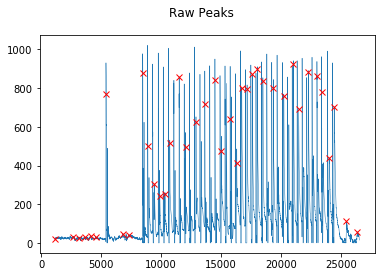

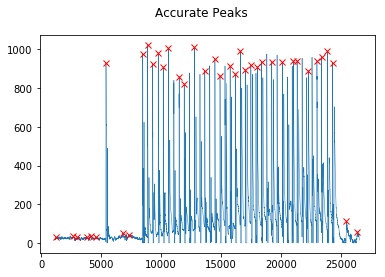

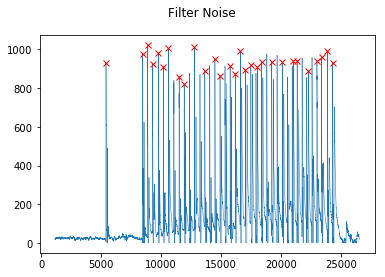

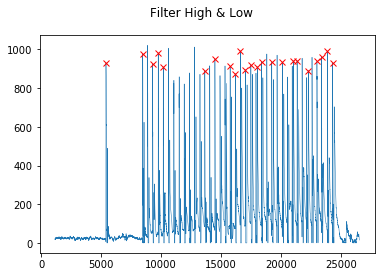

...

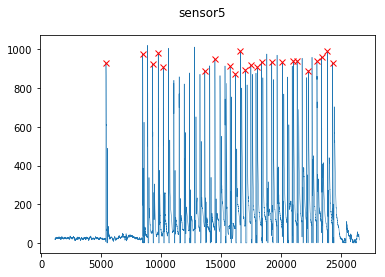

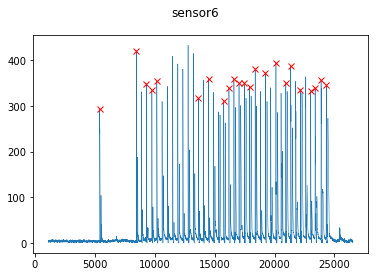

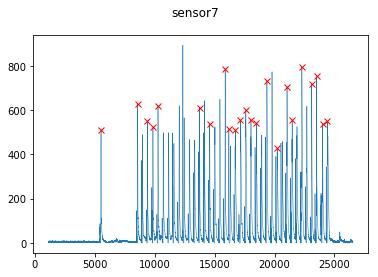

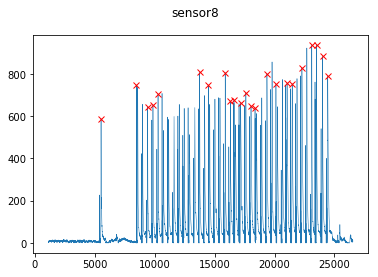

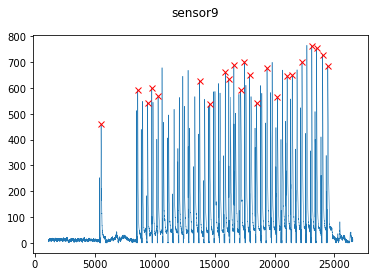

In [43]:
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\test\\l1-2f1.txt"
l12f1 = dataProcess(file,500,80,20)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\test\\l5-6f2.txt"
l56f2 = dataProcess(file,500,80,20)
file = "C:\\Users\\PangTouXian\\Desktop\\gao project\\experiment\\test\\l5689f3.txt"
l5689f3 = dataProcess(file,500,80,20)

In [47]:
test0 = l5689f3
#l12f1
#l56f2
#l5689f3

'''position detection'''
for i in range(np.shape(test0)[0]):
    result1 = TestModel1(model=trained_model1, data=test0[i])
    print(result1[8][0]+1,result1[7][0]+1)

'''force amplitude detection'''
for i in range(np.shape(test0)[0]):
    result1 = TestModel2(model1=trained_model1,model2=trained_model2, data=test0[i])
    print(result1[2][0]+1)

6 8
6 8
8 6
8 6
6 8
8 7
6 8
7 6
8 6
8 9
8 6
8 7
8 6
6 8
7 6
8 6
7 6
8 6
7 6
8 7
7 8
8 6
8 6
3
3
3
3
3
3
3
3
1
1
3
1
1
3
3
1
3
1
3
3
1
1
1
